# EDA on Greeks

### Notes:
***The main purpose of this notebook is for me to practice<br>So if you find something weird, please tell me. <br>I will try to understand and modify the code.***

I am a newbie in Data Science & Programming Language itself<br>
(started learning Python as my first programming language since March 2023).

I believe I can find some meaningful pattern that separates each Greek Letter into classes.<br>
Rather than simply running ML/DL on the Train Dataset (which wasn't successful), I decided to focus and perform some analysis on Greeks.<br>



## Please feel free to leave comment and share your opinion.
#### If you think my trials are meaningful, please give an upvote :)
#### It really motivates me studying on this field.


# Self-Review

It has been a memorable notebook updates.<br>
When I just started updating this notebook, I didn't think this notebook would and could get any medal.<br>
Thank you for having your interests on my work, and please keep an eye on my next works too!<br>
I will probably be focusing on NLP tasks as I found my interest there.<br>

What have I learned through this notebooke is that manually finding missing values for training data, unless I find pattern for each and every value in each and every column, does not help (or maybe a little bit) on improving the final score.<br>

Because manually finding missing values for specific column and row, cannot be applied to filling out missing data in the test data if there is any.<br><br>
Well, at least I learned something other than pandas skills from here.

# Version Updates 
#### ***Version 36 - Final Update:*** *Updated Self-Review above*
***Version 34 & 35:*** *Continuing for getting results by finiding greeks value.*<br>
***Version 32 & 33:*** *Got LB score (0.71) with AutoML.*<br>
***Version 31:*** *Submission based on @vadimkamaev 's code.*<br>
***Version 30:*** *Finished filling in Missing Value.*<br>
***Version 29:*** *Separated BQ_missing_df based on BN, modulized 'same_value'.*<br>
***Version 27 & 28:*** *Only Column BQ left for filling in missing values* (Error Occured...)<br>
***Version 25 & 26:*** *Updated Visualization codes and simplified the codes, filled in DU & CC again with a new logic*<br>
***Version 23 & 24:*** *Stuck with column 'CC', but still managed to fill in Column 'CC', Row 330*<br>
***Version 22:*** *Working on filling in missing values*<br>
***Version 19 ~ 21:*** *Realized that my logic had error. Modifying*<br>
***Version 17 & 18:*** *Found correlation and filled & dropped columns.*<br>
***Version 16:*** *Tried to solve filling in the missing value, but confronted a hardship.*<br>
***Version 14 & 15:*** *Added Statistical Information of train_r_com DF.*<br>
***Version 10 ~ 13:*** *Line separators for Markdown was not working... tried to fix it, but just added empty lines instead.*<br>
***Version 9:*** *Cleansed Visualized plots, Added Epsilon - Greek Letter correlation research, Collapsed all untidy info*<br>
***Version 8:*** *Quick Save*<br>
***Version 7:*** *Updated Visualization Codes*<br>
***Version 6:*** *Added some comments per section*<br>
***Version 5:*** *Modified Notes*<br>
***Version 4:*** *Updated Notes Above*<br>
***Version 3:*** *Not Much Different from Version 2 (Small Updates Only)*<br>
***Version 2:*** *Major Update including EJ=0/1 Application*<br>
***Version 1:*** *First Update Until Correlation Comparison*<br>

# ***Importing Modules***

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import KNNImputer
import warnings
warnings.filterwarnings(action='ignore')

In [2]:
greeks_list_ = ['Alpha', 'Beta', 'Gamma', 'Delta']

#### ***Configuration Settings***
Visualization ON (True) / OFF (False)

In [3]:
visualization = True

#### ***Addressing file locations***

In [4]:
base_path = '/kaggle/input/icr-identify-age-related-conditions/'
train = pd.read_csv(base_path + 'train.csv')
test = pd.read_csv(base_path + 'test.csv')
greeks = pd.read_csv(base_path + 'greeks.csv')

submission = pd.read_csv(base_path + 'sample_submission.csv')

#### ***Predicting Alpha, Beta, Gamma, Delta for the Test dataset.***<br>
What I need to do is to let the machine learn from the Train and Greeks dataset on how each Greek letter is measured.<br>
Then apply the method to the test dataset.<br>

***Convert EJ column into numeric value***

In [5]:
EJ_mapping = {'A' : 0, 'B' : 1 }
train.EJ = train.EJ.map(EJ_mapping)

#### ***Dropping "Class" from Train dataset for future uses***

In [6]:
train_no_class = train.drop(columns='Class')
# train_no_class

In [7]:
temp_ = train_no_class.drop(columns='Id')
non_numeric_columns = []

for column in temp_.columns:
    try:
        pd.to_numeric(temp_[column])
    except ValueError:
        non_numeric_columns.append(column)

if non_numeric_columns:
    print("Columns with non-numeric values:")
    for column in non_numeric_columns:
        print(column)
else:
    print("No non-numeric values found in the DataFrame.")

No non-numeric values found in the DataFrame.


#### ***Dropping "Epsilon" from Greeks to merge it into the Train Dataset***
I may need to add 'Epsilon' again to find connection with Beta. (Possibly Delta as well)

In [8]:
label_encoder = LabelEncoder()

greeks_for_label_encoding = greeks.drop(columns=['Id', 'Epsilon'])
for idx in greeks_for_label_encoding:
    greeks_for_label_encoding[idx] = label_encoder.fit_transform(greeks_for_label_encoding[idx])

greeks_ready = pd.concat([greeks['Id'], greeks_for_label_encoding], axis=1)
# greeks_ready

#### ***Merging Train and Greeks Datasets***

No need of Class column for now

In [9]:
train_temp = pd.merge(train_no_class, greeks_ready, on='Id', how='right')
train_ready = train_temp.drop(columns='Id')
# train_ready

#### ***Checking missing data***
Check if there is any missing data.

In [10]:
train_ready[train_ready.isnull().any(axis=1)]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta
8,0.346113,3238.43674,85.200147,28.888816,8.138688,4.021986,0.025578,8.243016,3.626448,6569.370010,...,17.245908,147.218610,4589.611956,29.771721,54.675576,0.073416,0,2,6,1
15,0.666588,3657.78160,304.283751,75.418144,8.138688,12.818973,0.025578,8.167392,1.229900,3597.873030,...,4.102182,72.611063,2218.449060,23.806958,35.843392,0.015231,0,2,6,1
18,0.269199,1586.67784,85.200147,14.459893,8.138688,4.907886,0.032886,7.007824,3.521028,7125.170390,...,16.362218,72.611063,3597.877440,31.330820,25.444796,0.011000,0,2,6,1
23,0.371751,2354.54142,105.030540,5.150311,8.138688,10.409325,0.025578,11.526358,2.754976,5435.445190,...,21.664358,198.469061,5987.708568,32.610844,15.019194,0.136552,0,2,6,1
24,0.158101,3257.64549,138.368592,8.640630,18.385464,4.146012,0.182700,4.099451,7.836220,3633.584335,...,8.311337,72.611063,1884.728169,48.039971,37.160256,21.978000,0,1,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
583,0.282018,4226.17426,91.392246,13.704225,8.138688,4.916745,0.025578,9.415188,1.229900,6144.797390,...,12.660022,72.611063,2118.717486,20.714807,29.786332,0.069164,0,2,6,1
594,0.670861,5501.73569,93.822057,6.993026,8.138688,6.511365,0.025578,9.541228,1.229900,4126.619270,...,37.310322,143.490662,1849.552461,31.371751,10.043660,NaN,0,2,6,1
602,0.350386,5431.63797,85.200147,11.607556,8.138688,7.565586,0.025578,10.269109,2.393034,6276.344750,...,12.027486,212.210348,9146.473587,17.287766,30.712252,0.171600,0,2,6,1
603,0.662315,1704.39874,123.807144,68.353887,8.138688,5.563452,0.104139,6.736838,1.229900,4949.693140,...,12.073996,72.611063,2369.417670,19.367805,25.591400,0.130680,0,2,6,1


#### ***Filling Out Missing Data with KNNImputer***
It is not a great idea to leave the missing data.<br>
But is there any better way to fill out the missing data?<br>
I tried to find the correlations between each column and fill out the missing data, but I learned that how KNNImputer work is the way I was planned to do.<br>
So... yep, I think KNNImputer would do.<br>

## For version 9:
I will not fill out missing data.<br>
I think it makes the charts even more confusing.<br>
I will try manual method to fill out the missing data.<br>
It will consume a lot of time and effort but we still got time.<br>

#### ***Replacing Outliers***
After several attempts on the visualization, I couldn't clearly see the rest of the plots due to the outliers.

In [11]:
not_to_be_included_1  = ['EJ', 'Alpha', 'Beta', 'Gamma', 'Delta', 'Class']

In [12]:
train_r_com = train_ready

In [13]:
## activate the greek letter that you want to count value

# for greek in greeks_list_:
#     print(f'{train_r_com[greek].value_counts()}\n')

# Grouping Greeks by Greeks

In [14]:
for greek in greeks_list_:
    display(greeks.groupby([greek]).nunique())

,Id,Beta,Gamma,Delta,Epsilon
Alpha,,,,,
A,509,2,2,4,130
B,61,3,2,4,57
D,18,3,2,3,17
G,29,3,2,3,25


,Id,Alpha,Gamma,Delta,Epsilon
Beta,,,,,
A,8,3,4,1,8
B,202,4,6,2,82
C,407,4,7,4,126


,Id,Alpha,Beta,Delta,Epsilon
Gamma,,,,,
A,11,1,3,3,10
B,18,1,3,3,15
E,8,1,2,3,7
F,10,1,2,2,10
G,8,1,1,2,8
H,53,1,3,4,50
M,445,1,2,4,90
N,64,1,1,2,44


,Id,Alpha,Beta,Gamma,Epsilon
Delta,,,,,
A,75,4,3,7,43
B,456,4,2,7,115
C,64,4,1,6,39
D,22,2,1,3,20


# ***Separating train_r_com DataFrame into each Greek Letter value.***
Wanted to see the whole dataset per Greek Letter Class.

In [15]:
temp_0 = []
temp_1 = []
temp_2 = []
temp_3 = []
for idx in range(len(train_r_com['Alpha'])):
    if train_r_com['Alpha'].iat[idx] == 0:
        temp_0.append(train_r_com.iloc[idx])        
    elif train_r_com['Alpha'].iat[idx] == 1:
        temp_1.append(train_r_com.iloc[idx])        
    elif train_r_com['Alpha'].iat[idx] == 2:
        temp_2.append(train_r_com.iloc[idx])        
    elif train_r_com['Alpha'].iat[idx] == 3:
        temp_3.append(train_r_com.iloc[idx])        

alpha_only_0 = pd.DataFrame(temp_0)
alpha_only_1 = pd.DataFrame(temp_1)
alpha_only_2 = pd.DataFrame(temp_2)
alpha_only_3 = pd.DataFrame(temp_3)


# alpha_only_0.to_excel('/kaggle/working/alpha_only_0.xlsx')
# alpha_only_1.to_excel('/kaggle/working/alpha_only_1.xlsx')
# alpha_only_2.to_excel('/kaggle/working/alpha_only_2.xlsx')
# alpha_only_3.to_excel('/kaggle/working/alpha_only_3.xlsx')

In [16]:
temp_0 = []
temp_1 = []
temp_2 = []

for idx in range(len(train_r_com['Beta'])):
    if train_r_com['Beta'].iat[idx] == 0:
        temp_0.append(train_r_com.iloc[idx])        
    elif train_r_com['Beta'].iat[idx] == 1:
        temp_1.append(train_r_com.iloc[idx])        
    elif train_r_com['Beta'].iat[idx] == 2:
        temp_2.append(train_r_com.iloc[idx])        


beta_only_0 = pd.DataFrame(temp_0)
beta_only_1 = pd.DataFrame(temp_1)
beta_only_2 = pd.DataFrame(temp_2)


# beta_only_0.to_excel('/kaggle/working/beta_only_0.xlsx')
# beta_only_1.to_excel('/kaggle/working/beta_only_1.xlsx')
# beta_only_2.to_excel('/kaggle/working/beta_only_2.xlsx')

In [17]:
temp_0 = []
temp_1 = []
temp_2 = []
temp_3 = []
temp_4 = []
temp_5 = []
temp_6 = []
temp_7 = []


for idx in range(len(train_r_com['Gamma'])):
    if train_r_com['Gamma'].iat[idx] == 0:
        temp_0.append(train_r_com.iloc[idx])        
    elif train_r_com['Gamma'].iat[idx] == 1:
        temp_1.append(train_r_com.iloc[idx])        
    elif train_r_com['Gamma'].iat[idx] == 2:
        temp_2.append(train_r_com.iloc[idx])        
    elif train_r_com['Gamma'].iat[idx] == 3:
        temp_3.append(train_r_com.iloc[idx])        
    elif train_r_com['Gamma'].iat[idx] == 4:
        temp_4.append(train_r_com.iloc[idx])        
    elif train_r_com['Gamma'].iat[idx] == 5:
        temp_5.append(train_r_com.iloc[idx])        
    elif train_r_com['Gamma'].iat[idx] == 6:
        temp_6.append(train_r_com.iloc[idx])        
    elif train_r_com['Gamma'].iat[idx] == 7:
        temp_7.append(train_r_com.iloc[idx])        

        
gamma_only_0 = pd.DataFrame(temp_0)
gamma_only_1 = pd.DataFrame(temp_1)
gamma_only_2 = pd.DataFrame(temp_2)
gamma_only_3 = pd.DataFrame(temp_3)
gamma_only_4 = pd.DataFrame(temp_4)
gamma_only_5 = pd.DataFrame(temp_5)
gamma_only_6 = pd.DataFrame(temp_6)
gamma_only_7 = pd.DataFrame(temp_7)


# gamma_only_0.to_excel('/kaggle/working/gamma_only_0.xlsx')
# gamma_only_1.to_excel('/kaggle/working/gamma_only_1.xlsx')
# gamma_only_2.to_excel('/kaggle/working/gamma_only_2.xlsx')
# gamma_only_3.to_excel('/kaggle/working/gamma_only_3.xlsx')
# gamma_only_4.to_excel('/kaggle/working/gamma_only_4.xlsx')
# gamma_only_5.to_excel('/kaggle/working/gamma_only_5.xlsx')
# gamma_only_6.to_excel('/kaggle/working/gamma_only_6.xlsx')
# gamma_only_7.to_excel('/kaggle/working/gamma_only_7.xlsx')

In [18]:
temp_0 = []
temp_1 = []
temp_2 = []
temp_3 = []


for idx in range(len(train_r_com['Delta'])):
    if train_r_com['Delta'].iat[idx] == 0:
        temp_0.append(train_r_com.iloc[idx])        
    elif train_r_com['Delta'].iat[idx] == 1:
        temp_1.append(train_r_com.iloc[idx])        
    elif train_r_com['Delta'].iat[idx] == 2:
        temp_2.append(train_r_com.iloc[idx])        
    elif train_r_com['Delta'].iat[idx] == 3:
        temp_3.append(train_r_com.iloc[idx])           

        
delta_only_0 = pd.DataFrame(temp_0)
delta_only_1 = pd.DataFrame(temp_1)
delta_only_2 = pd.DataFrame(temp_2)
delta_only_3 = pd.DataFrame(temp_3)


# delta_only_0.to_excel('/kaggle/working/delta_only_0.xlsx')
# delta_only_1.to_excel('/kaggle/working/delta_only_1.xlsx')
# delta_only_2.to_excel('/kaggle/working/delta_only_2.xlsx')
# delta_only_3.to_excel('/kaggle/working/delta_only_3.xlsx')

In [19]:
alpha_df_list = ['alpha_only_0', 'alpha_only_1', 'alpha_only_2', 'alpha_only_3']
beta_df_list = ['beta_only_0', 'beta_only_1', 'beta_only_2']
gamma_df_list = ['gamma_only_0', 'gamma_only_1', 'gamma_only_2', 'gamma_only_3', 'gamma_only_4', 'gamma_only_5', 'gamma_only_6', 'gamma_only_7']
delta_df_list = ['delta_only_0', 'delta_only_1', 'delta_only_2', 'delta_only_3']
greeks_df_list = [alpha_df_list, beta_df_list, gamma_df_list, delta_df_list]

# ***Visualizing Train set, per Greek Letter***
Let's see which column each Greek Letter have in special.
Expand the cells below if you would like to see how the scatter plots are.<br>
There are 55 charts each, it may cause some delay and make your fingers tired by scrolling all the way down :)<br>

In [20]:
def j_multiple_scatter(df_name_list, plots_per_row, not_to_be_included):

    data_list = []

    for df_temp in df_name_list:  # greek_letter = alpha_0, alpha_1 ...
        _df = globals()[df_temp]
        _df_name = df_temp
        scatter_data = {}
        num_cols = len(_df.T) - len(not_to_be_included)
        
        for column in _df:  # each column
            if column in not_to_be_included:
                continue
                
            column_data = _df[column]
            identifier = f"{_df_name.split('_')[0]}_{column}"

            scatter_data[identifier] = {"x": column_data.index.tolist(), "y": column_data.values.tolist()}

        data_list.append(scatter_data)

    
    total_plots = num_cols
    plots_per_row = plots_per_row

    num_rows = (total_plots - 1) // plots_per_row + 1
    fig, axs = plt.subplots(num_rows, plots_per_row, figsize=(30, num_rows * 5))

    for i, key in enumerate(data_list[0].keys()):
        row_idx = i // plots_per_row
        col_idx = i % plots_per_row
        
        for idx in range(len(df_name_list)):
            data_x = data_list[idx][key]['x']
            data_y = data_list[idx][key]['y']
            axs[row_idx, col_idx].scatter(data_x, data_y)

        axs[row_idx, col_idx].set_xlabel('Index')
        axs[row_idx, col_idx].set_ylabel(key)

        axs[row_idx, col_idx].set_title(f'Scatter Plot: {key}')

    plt.tight_layout()
    plt.show()

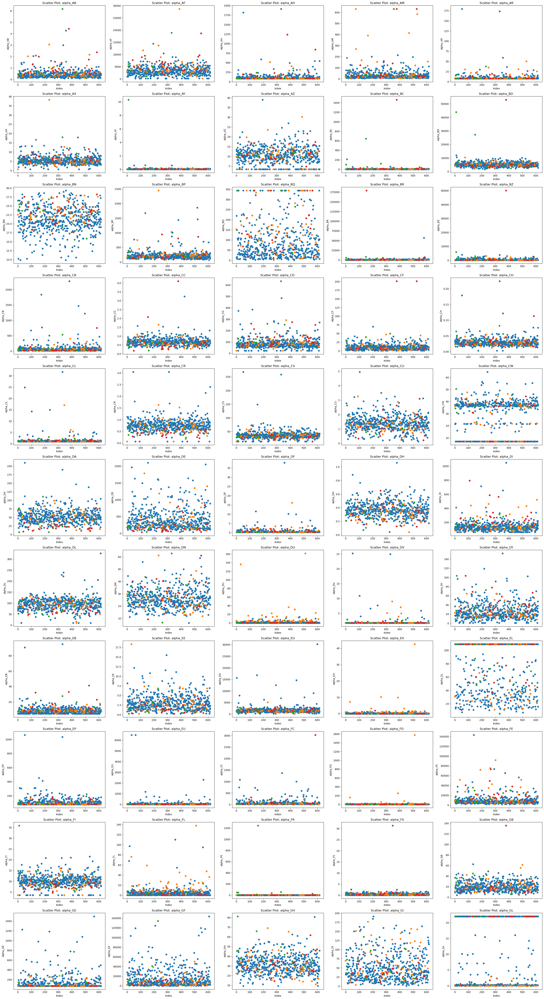

In [21]:
if visualization == True:
    j_multiple_scatter(alpha_df_list, 5, not_to_be_included_1)

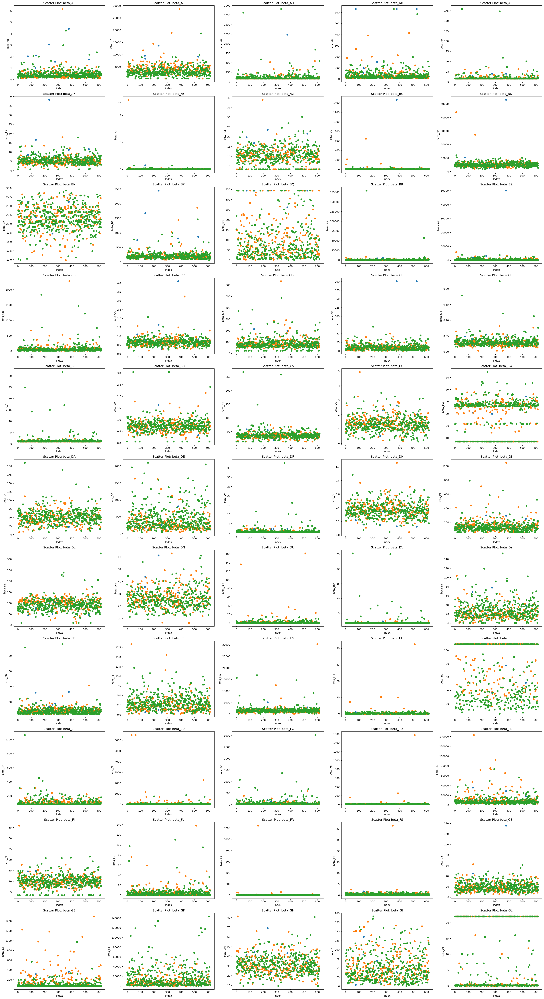

In [22]:
if visualization == True:
    j_multiple_scatter(beta_df_list, 5, not_to_be_included_1)

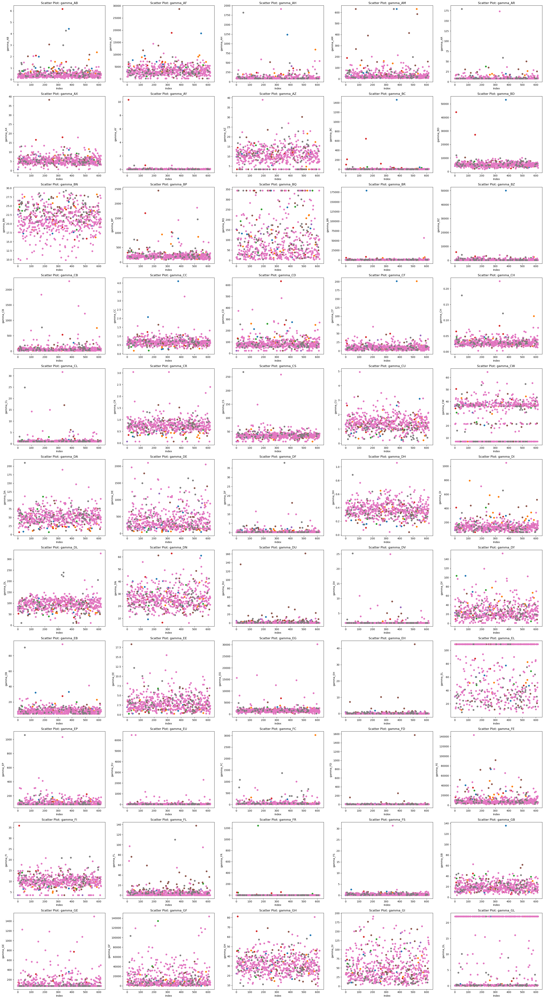

In [23]:
if visualization == True:
    j_multiple_scatter(gamma_df_list, 5, not_to_be_included_1)

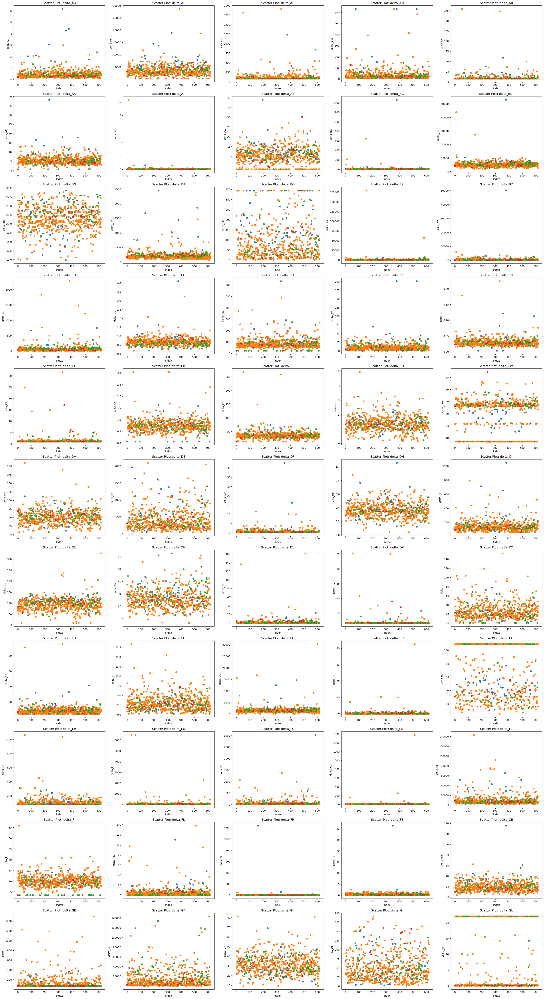

In [24]:
if visualization == True:
    j_multiple_scatter(delta_df_list, 5, not_to_be_included_1)

# ***Checking which are the Unique Value per each Greek Letter Class***
By doing this, we can check which columns are important and which columns are not.

In [25]:
not_to_be_included  = ['Alpha', 'Beta', 'Gamma', 'Delta', 'Class']

In [26]:
for which_letter in greeks_df_list:
    for greek_letter in which_letter:
        greek_letter_df = globals()[greek_letter]
        greek_letter_df.name = greek_letter
        temp = []
        
        for column_idx in range(len(greek_letter_df.columns)):
            column_name = greek_letter_df.columns[column_idx]
            if column_name in not_to_be_included:
                continue
            if greek_letter_df.iloc[:, column_idx].nunique() == 1:
                print(greek_letter + ", number of rows =", len(greek_letter_df))
                print(f"{greek_letter_df.columns[column_idx]}, {greek_letter_df.iloc[:,column_idx].unique()[0]}\n")

                

alpha_only_1, number of rows = 61
EJ, 1.0

gamma_only_0, number of rows = 11
DV, 1.74307

gamma_only_2, number of rows = 8
AY, 0.025578

gamma_only_2, number of rows = 8
DF, 0.23868

gamma_only_2, number of rows = 8
DV, 1.74307

gamma_only_4, number of rows = 8
EJ, 1.0

gamma_only_5, number of rows = 53
EJ, 1.0

gamma_only_7, number of rows = 64
EJ, 1.0

delta_only_3, number of rows = 22
EJ, 1.0

delta_only_3, number of rows = 22
GE, 72.611063



# ***Correlation between each columns to each greek letter.***
I couldn't see the clear thresholds of medical conditions that separates within each greek letter, I decided to add some codes to show correlations of each column to each greek letter.<br>
Before checking the correlations between columns, I will check the relationship between each greek letter.<br>

In [27]:
to_be_included = ['Beta', 'Gamma', 'Delta']

count = 0
while count < len(alpha_df_list):
    for greek in to_be_included:
        alpha_indices = train_r_com['Alpha'] == count
        print(f'{greek} unique value when Alpha = {count}:', train_r_com.loc[alpha_indices, greek].unique())
    print()
    count += 1

Beta unique value when Alpha = 0: [2 1]
Gamma unique value when Alpha = 0: [6 7]
Delta unique value when Alpha = 0: [1 2 0 3]

Beta unique value when Alpha = 1: [2 1 0]
Gamma unique value when Alpha = 1: [4 5]
Delta unique value when Alpha = 1: [3 1 0 2]

Beta unique value when Alpha = 2: [1 0 2]
Gamma unique value when Alpha = 2: [3 2]
Delta unique value when Alpha = 2: [1 0 2]

Beta unique value when Alpha = 3: [1 2 0]
Gamma unique value when Alpha = 3: [0 1]
Delta unique value when Alpha = 3: [1 2 0]



#### ***From the analysis on Greeks above, below are the meaningful outcomes.***
1. If Alpha is 0 (A), Gamma is 6, 7<br>
2. If Beta is 0, Alpha is not 0 (A)<br>

#### ***So let's find out which column makes Gamma 6, 7 and Beta 0, through correlation analysis.***

In [28]:
high_threshold = 0.8
low_threshold = -0.8

In [29]:
if visualization:
    alpha_0_cols = []
    alpha_1_cols = []
    alpha_2_cols = []
    alpha_3_cols = []

    for greek_letter in alpha_df_list: # greek_letter = alpha_0, alpha_1 ...
        greek_letter_df = globals()[greek_letter]
        columns_of_interest = list(train_r_com.columns[:-4])
        subset_df = greek_letter_df[columns_of_interest]
        correlation_matrix = subset_df.corr()

        print(f'correlation matrix for {greek_letter}:')

        printed_pairs = set()


        for col1 in correlation_matrix.columns:
            for col2 in correlation_matrix.columns:
                if col1 != col2:
                    if correlation_matrix.loc[col1, col2] > high_threshold or correlation_matrix.loc[col1, col2] < low_threshold:
                        pair = tuple(sorted([col1, col2]))
                        if pair not in printed_pairs:
                            print(f"{col1} and {col2} have a correlation coefficient of {correlation_matrix.loc[col1, col2]}")
                            printed_pairs.add(pair)



        if greek_letter == 'alpha_only_0':
            alpha_0_cols.extend(list(printed_pairs))
        elif greek_letter == 'alpha_only_1':
            alpha_1_cols.extend(list(printed_pairs))
        elif greek_letter == 'alpha_only_2':
            alpha_2_cols.extend(list(printed_pairs))
        elif greek_letter == 'alpha_only_3':
            alpha_3_cols.extend(list(printed_pairs))

        print()
    #     correlation_matrix.to_csv(f'./greeks_analysis/alpha/{greek_letter}_correlation.csv')

    alpha_0_cols_c = str(alpha_0_cols).replace('[', '').replace(']', '').replace("'", "")
    alpha_1_cols_c = str(alpha_1_cols).replace('[', '').replace(']', '').replace("'", "")
    alpha_2_cols_c = str(alpha_2_cols).replace('[', '').replace(']', '').replace("'", "")
    alpha_3_cols_c = str(alpha_3_cols).replace('[', '').replace(']', '').replace("'", "")

    print("\nalpha_0 correlated columns = ", alpha_0_cols_c)
    print("\nalpha_1 correlated columns = ", alpha_1_cols_c)
    print("\nalpha_2 correlated columns = ", alpha_2_cols_c)
    print("\nalpha_3 correlated columns = ", alpha_3_cols_c)

correlation matrix for alpha_only_0:
AH and AR have a correlation coefficient of 0.8630870411194407
AH and CL have a correlation coefficient of 0.8293052078825759
AH and DV have a correlation coefficient of 0.869498334511021
AR and CL have a correlation coefficient of 0.8377984607952346
AR and DV have a correlation coefficient of 0.8974692985810848
AR and EB have a correlation coefficient of 0.8124134185392617
AR and EP have a correlation coefficient of 0.8099113328042031
AY and EP have a correlation coefficient of 0.8462189078078324
CL and DV have a correlation coefficient of 0.9652925060780747
CS and EP have a correlation coefficient of 0.8190190453910607
DU and EH have a correlation coefficient of 0.8340489268186189
EH and FD  have a correlation coefficient of 0.8565852121474326
EJ and GL have a correlation coefficient of -0.9745871204945853

correlation matrix for alpha_only_1:
AR and DI have a correlation coefficient of 0.8098984651143636
AX and BP have a correlation coefficient o

#### ***As EJ, FL and GL are either categorical, or category-like values, it is better if we skip on them.***

In [30]:
if visualization:
    beta_0_cols = []
    beta_1_cols = []
    beta_2_cols = []

    for greek_letter in beta_df_list: # greek_letter = beta_0, beta_1 ...
        greek_letter_df = globals()[greek_letter]
        columns_of_interest = list(train_r_com.columns[:-4])
        subset_df = greek_letter_df[columns_of_interest]
        correlation_matrix = subset_df.corr()

        print(f'correlation matrix for {greek_letter}:')

        printed_pairs = set()

        for col1 in correlation_matrix.columns:
            for col2 in correlation_matrix.columns:
                if col1 != col2:
                    if correlation_matrix.loc[col1, col2] > high_threshold or correlation_matrix.loc[col1, col2] < low_threshold:
                        pair = tuple(sorted([col1, col2]))
                        if pair not in printed_pairs:
                            print(f"{col1} and {col2} have a correlation coefficient of {correlation_matrix.loc[col1, col2]}")
                            printed_pairs.add(pair)

        if greek_letter == 'beta_only_0':
            beta_0_cols.extend(list(printed_pairs))
        elif greek_letter == 'beta_only_1':
            beta_1_cols.extend(list(printed_pairs))
        elif greek_letter == 'beta_only_2':
            beta_2_cols.extend(list(printed_pairs))


        print()

    #     correlation_matrix.to_csv(f'./greeks_analysis/beta/{greek_letter}_correlation.csv')

    beta_0_cols_c = str(beta_0_cols).replace('[', '').replace(']', '').replace("'", "")
    beta_1_cols_c = str(beta_1_cols).replace('[', '').replace(']', '').replace("'", "")
    beta_2_cols_c = str(beta_2_cols).replace('[', '').replace(']', '').replace("'", "")


correlation matrix for beta_only_0:
AB and BD  have a correlation coefficient of 0.8305798395227483
AB and BZ have a correlation coefficient of 0.8089095569686517
AB and CC have a correlation coefficient of 0.9337899679815717
AB and CL have a correlation coefficient of 0.8443905375898899
AB and DE have a correlation coefficient of 0.8472769249548551
AB and GB have a correlation coefficient of 0.8760004831049489
AB and GE have a correlation coefficient of 0.8172654570514113
AH and BC have a correlation coefficient of 0.9996977739696467
AH and BD  have a correlation coefficient of 0.9878859941351831
AH and BZ have a correlation coefficient of 0.9979263216276
AH and CC have a correlation coefficient of 0.9392080498227098
AH and CL have a correlation coefficient of 0.9087077143525736
AH and DE have a correlation coefficient of 0.9433463000880519
AH and GB have a correlation coefficient of 0.9646524282132685
AX and BP have a correlation coefficient of 0.914499642487945
AX and CR have a corr

#### ***Hooray! We got bunch of columns that make beta 0.***

In [31]:
if visualization:
    gamma_0_cols = []
    gamma_1_cols = []
    gamma_2_cols = []
    gamma_3_cols = []
    gamma_4_cols = []
    gamma_5_cols = []
    gamma_6_cols = []
    gamma_7_cols = []


    for greek_letter in gamma_df_list: # greek_letter = alpha_0, alpha_1 ...
        greek_letter_df = globals()[greek_letter]
        columns_of_interest = list(train_r_com.columns[:-4])
        subset_df = greek_letter_df[columns_of_interest]
        correlation_matrix = subset_df.corr()

        print(f'correlation matrix for {greek_letter}:')

        printed_pairs = set()

        for col1 in correlation_matrix.columns:
            for col2 in correlation_matrix.columns:
                if col1 != col2:
                    if correlation_matrix.loc[col1, col2] > high_threshold or correlation_matrix.loc[col1, col2] < low_threshold:
                        pair = tuple(sorted([col1, col2]))
                        if pair not in printed_pairs:
                            print(f"{col1} and {col2} have a correlation coefficient of {correlation_matrix.loc[col1, col2]}")
                            printed_pairs.add(pair)


        if greek_letter == 'gamma_only_0':
            gamma_0_cols.extend(list(printed_pairs))
        elif greek_letter == 'gamma_only_1':
            gamma_1_cols.extend(list(printed_pairs))
        elif greek_letter == 'gamma_only_2':
            gamma_2_cols.extend(list(printed_pairs))
        elif greek_letter == 'gamma_only_3':
            gamma_3_cols.extend(list(printed_pairs))
        elif greek_letter == 'gamma_only_4':
            gamma_4_cols.extend(list(printed_pairs))
        elif greek_letter == 'gamma_only_5':
            gamma_5_cols.extend(list(printed_pairs))
        elif greek_letter == 'gamma_only_6':
            gamma_6_cols.extend(list(printed_pairs))
        elif greek_letter == 'gamma_only_7':
            gamma_7_cols.extend(list(printed_pairs))

        print()

    #     correlation_matrix.to_csv(f'./greeks_analysis/gamma/{greek_letter}_correlation.csv')

    gamma_0_cols_c = str(gamma_0_cols).replace('[', '').replace(']', '').replace("'", "")
    gamma_1_cols_c = str(gamma_1_cols).replace('[', '').replace(']', '').replace("'", "")
    gamma_2_cols_c = str(gamma_2_cols).replace('[', '').replace(']', '').replace("'", "")
    gamma_3_cols_c = str(gamma_3_cols).replace('[', '').replace(']', '').replace("'", "")
    gamma_4_cols_c = str(gamma_4_cols).replace('[', '').replace(']', '').replace("'", "")
    gamma_5_cols_c = str(gamma_5_cols).replace('[', '').replace(']', '').replace("'", "")
    gamma_6_cols_c = str(gamma_6_cols).replace('[', '').replace(']', '').replace("'", "")
    gamma_7_cols_c = str(gamma_7_cols).replace('[', '').replace(']', '').replace("'", "")

correlation matrix for gamma_only_0:
AB and AH have a correlation coefficient of 0.9482833500115596
AB and AM have a correlation coefficient of 0.9569632211463207
AB and AR have a correlation coefficient of 0.8489640145434858
AB and BC have a correlation coefficient of 0.936441057184628
AB and BD  have a correlation coefficient of 0.9275362067205938
AB and BP have a correlation coefficient of 0.9300248808061421
AB and BZ have a correlation coefficient of 0.9415892997107647
AB and CC have a correlation coefficient of 0.9863279633974766
AB and CF have a correlation coefficient of 0.9440054062046126
AB and GB have a correlation coefficient of 0.9367332791841593
AB and GE have a correlation coefficient of 0.9178586577130109
AF and DN have a correlation coefficient of 0.8335581001963515
AH and AM have a correlation coefficient of 0.9968718534391925
AH and AR have a correlation coefficient of 0.8267319745153382
AH and BC have a correlation coefficient of 0.9983958085774021
AH and BD  have a 

#### ***Unfortunately, we couldn't find meaningful columns that make Gamma 6 or 7***

In [32]:
if visualization:
    delta_0_cols = []
    delta_1_cols = []
    delta_2_cols = []
    delta_3_cols = []

    for greek_letter in delta_df_list: # greek_letter = alpha_0, alpha_1 ...
        greek_letter_df = globals()[greek_letter]
        columns_of_interest = list(train_r_com.columns[:-4])
        subset_df = greek_letter_df[columns_of_interest]
        correlation_matrix = subset_df.corr()

        print(f'correlation matrix for {greek_letter}:')

        printed_pairs = set()

        for col1 in correlation_matrix.columns:
            for col2 in correlation_matrix.columns:
                if col1 != col2:
                    if correlation_matrix.loc[col1, col2] > high_threshold or correlation_matrix.loc[col1, col2] < low_threshold:
                        pair = tuple(sorted([col1, col2]))
                        if pair not in printed_pairs:
                            print(f"{col1} and {col2} have a correlation coefficient of {correlation_matrix.loc[col1, col2]}")
                            printed_pairs.add(pair)

        if greek_letter == 'delta_only_0':
            delta_0_cols.extend(list(printed_pairs))
        elif greek_letter == 'delta_only_1':
            delta_1_cols.extend(list(printed_pairs))
        elif greek_letter == 'delta_only_2':
            delta_2_cols.extend(list(printed_pairs))
        elif greek_letter == 'delta_only_3':
            delta_3_cols.extend(list(printed_pairs))

        print()

    #     correlation_matrix.to_csv(f'./greeks_analysis/delta/{greek_letter}_correlation.csv')

    delta_0_cols_c = str(delta_0_cols).replace('[', '').replace(']', '').replace("'", "")
    delta_1_cols_c = str(delta_1_cols).replace('[', '').replace(']', '').replace("'", "")
    delta_2_cols_c = str(delta_2_cols).replace('[', '').replace(']', '').replace("'", "")
    delta_3_cols_c = str(delta_3_cols).replace('[', '').replace(']', '').replace("'", "")

    # print("\ndelta_0 correlated columns = ", delta_0_cols_c)
    # print("\ndelta_1 correlated columns = ", delta_1_cols_c)
    # print("\ndelta_2 correlated columns = ", delta_2_cols_c)
    # print("\ndelta_3 correlated columns = ", delta_3_cols_c)

correlation matrix for delta_only_0:
AH and BC have a correlation coefficient of 0.9671575768834167
AH and BD  have a correlation coefficient of 0.9391502007364821
AH and BZ have a correlation coefficient of 0.969402940541853
AH and CC have a correlation coefficient of 0.8141973916779113
AH and GB have a correlation coefficient of 0.8245984841256964
AR and DF have a correlation coefficient of 0.9204818599916949
BC and BD  have a correlation coefficient of 0.963708807081024
BC and BZ have a correlation coefficient of 0.9972127980197962
BC and CC have a correlation coefficient of 0.8258568741023142
BC and GB have a correlation coefficient of 0.8549781881500957
BD  and BZ have a correlation coefficient of 0.9622785289884331
BD  and CC have a correlation coefficient of 0.857276453800256
BD  and GB have a correlation coefficient of 0.8365116681828509
BZ and CC have a correlation coefficient of 0.8310556842130967
BZ and GB have a correlation coefficient of 0.8582449945113172
DF and FL have a

#### ***We found many columns make Delta 2, but Delta 2 is included in all Alpha value, so it is not so meaningful.***

#### ***As aforementioned, if a patient (each row on the train dataset) belongs to Beta 0 category, they are assumed as having a disease (belongs to Alpha 1, 2 or 3).***
Therefore, let's check out the columns that has high correlations for Beta 0

### Version 6 -> 7 Edit
***No, I don't think this is correct.***<br>
There were only 8 columns that were in Beta 0.<br>
I realized that Beta 0 not being in Alpha 0 could only be coincidence.<br>
Now I think it is better to use the correlated columns for Gamma_only_0 through Gamma_only_4, there are 55 rows for this cluster.<br>

### Version 6 -> 7 Edit
***What if I lower the correlation threshold to 0.75 or 0.7?***

### Version 6 -> 7 Edit
It seems like that for alpha_only_1, EJ is 1.<br>
For gamma_only_4, gamma_only_5, gamma_only_7, delta_only_3 as well.<br>
I want to understand why EJ = 1 makes gamma_only_7 but not gamma_only_6 (when both of them refers to Alpha = 0).<br>

In [33]:
temp_0 = []
temp_1 = []

for idx in range(len(train_r_com['Beta'])):
    if train_r_com['EJ'].iat[idx] == 0:
        temp_0.append(train_r_com.iloc[idx])
    elif train_r_com['EJ'].iat[idx] == 1:
        temp_1.append(train_r_com.iloc[idx])

EJ_only_0 = pd.DataFrame(temp_0)
EJ_only_1 = pd.DataFrame(temp_1)

# EJ_only_0.to_excel('/kaggle/working/EJ_only_0.xlsx')
# EJ_only_1.to_excel('/kaggle/working/EJ_only_1.xlsx')


### There is another set of visualized charts below.
***Expand it if you wish to see the codes!***

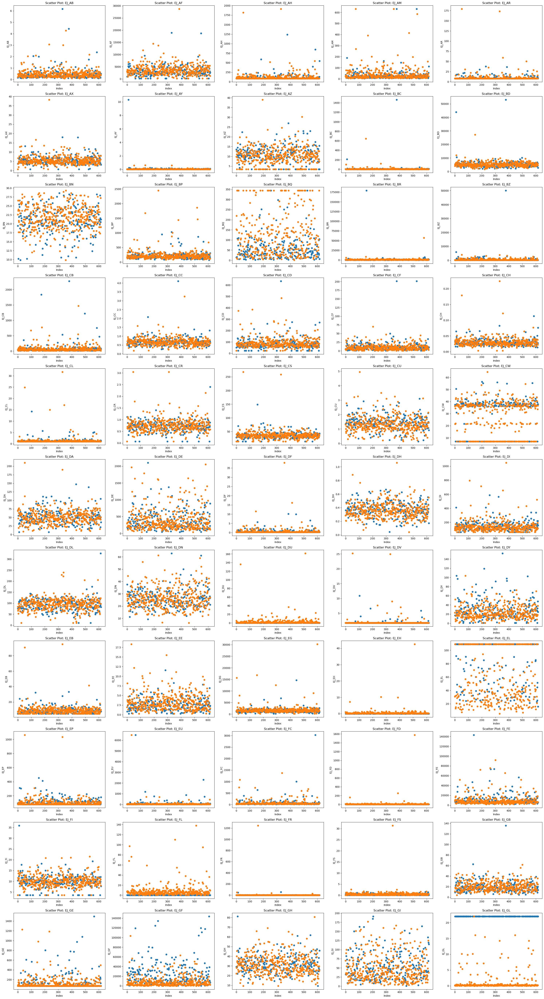

In [34]:
EJ_df_list = ['EJ_only_0', 'EJ_only_1']
not_to_be_included  = ['EJ', 'Alpha', 'Beta', 'Gamma', 'Delta', 'Class']

if visualization:
    j_multiple_scatter(EJ_df_list, 5, not_to_be_included)


In [35]:
### EJ_only_0
the_columns = ['DU', 'EH', 'FD ', 'FL', 'GL']

for sss in the_columns:
    print(f"sorted(EJ_only_0[{sss}].unique()) = {sorted(EJ_only_0[sss].unique())[0]}")

sorted(EJ_only_0[DU].unique()) = 0.0055176
sorted(EJ_only_0[EH].unique()) = 0.003042
sorted(EJ_only_0[FD ].unique()) = 0.29685
sorted(EJ_only_0[FL].unique()) = 0.173229
sorted(EJ_only_0[GL].unique()) = 21.978


# ***Visualizing per each Greek Letter Classes (Comparison)***

The aim for this is to simply see the trend and find which column is a differentiator, ***Not the specific value of it***

In [36]:
def get_df_name(df):
    name =[x for x in globals() if globals()[x] is df][0]
    return name

In [37]:
def j_4_plots(df, list_, Alphabet, numb, not_to_be_included):
    Alphabet = Alphabet
    numb = numb
    new_the_columns = [value for value in list_ if value != not_to_be_included]
    df_name = get_df_name(df)
    df_n = f"{df_name.split('_')[0]}_{df_name.split('_')[-1]}"
    for idx, sss in enumerate(new_the_columns):
        idx = idx + 1
        filtered_rows = df[(df[Alphabet] == numb) & (df[sss] == sorted(df[sss].unique())[0])]
        plt.subplot(2, 2, idx)
        for index, row in filtered_rows.iterrows():
            plt.plot(row, label=index)
        plt.xlabel('Column')
        plt.ylabel('Value')
        plt.title(f'{df_n} {Alphabet}_{numb} {sss}_Fixed')
        plt.xticks(rotation=90, fontsize=6)
        plt.subplots_adjust(bottom=0.2)

    plt.tight_layout()
    plt.show()

In [38]:
def j_plot(df, Alphabet, numb, to_be_included):
    Alphabet = Alphabet
    numb = numb
    df_name = get_df_name(df)
    df_n = f"{df_name.split('_')[0]}_{df_name.split('_')[-1]}"

    filtered_rows = df[(df[Alphabet] == numb) & (df[to_be_included] == sorted(df[to_be_included].unique())[0])]

    for index, row in filtered_rows.iterrows():
        plt.plot(row, label=index)

    plt.xlabel('Column')
    plt.ylabel('Value')
    plt.title(f'{df_n} {Alphabet}_{numb} {to_be_included}_Fixed')

    plt.xticks(rotation=90, fontsize=6)

    plt.subplots_adjust(bottom=0.2)
    plt.show()

### ***EJ = 0***
### ***Alpha Based***

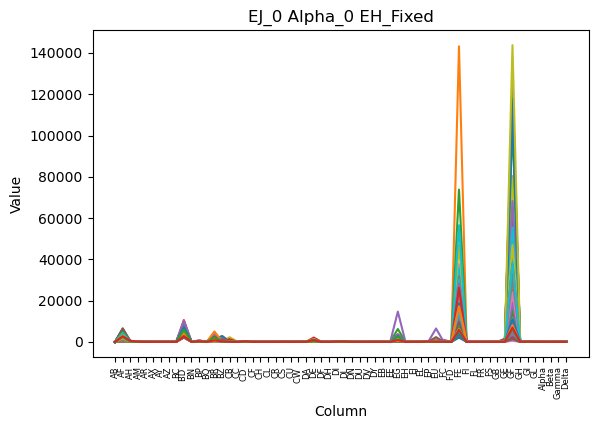

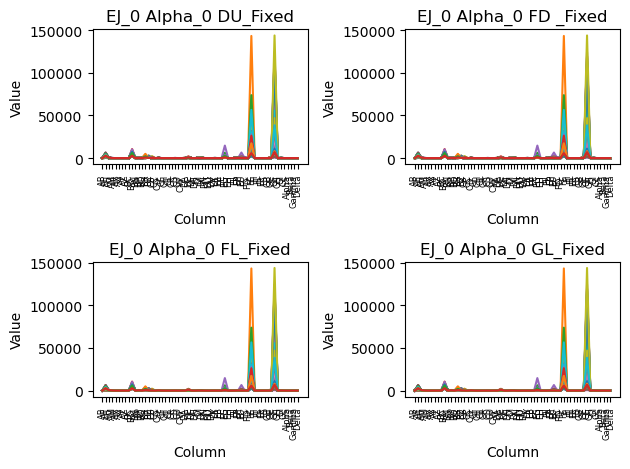

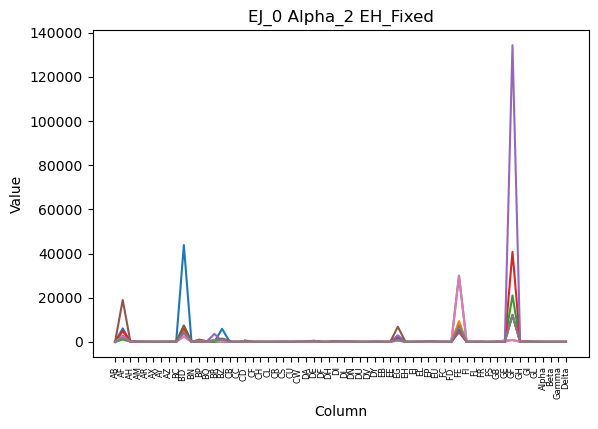

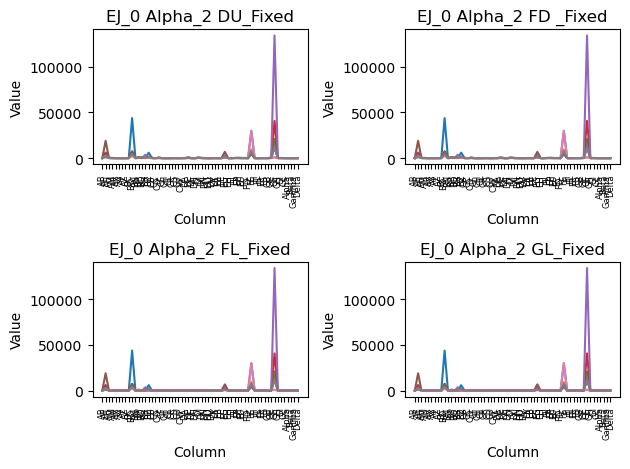

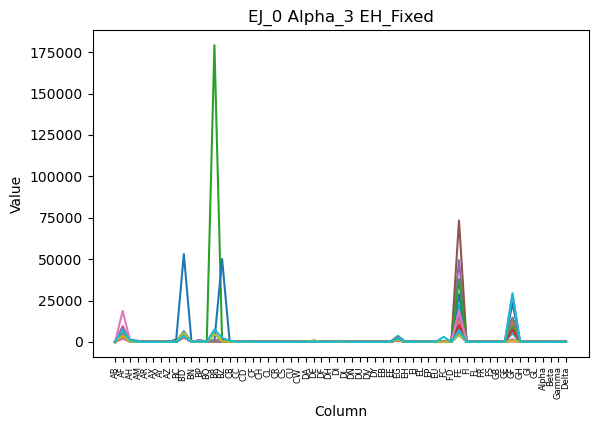

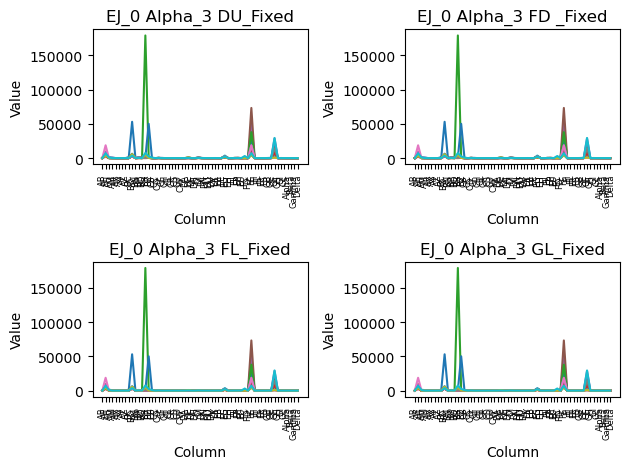

In [39]:
if visualization:
    j_plot(EJ_only_0, 'Alpha', 0, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Alpha', 0, 'EH')
    j_plot(EJ_only_0, 'Alpha', 2, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Alpha', 2, 'EH')
    j_plot(EJ_only_0, 'Alpha', 3, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Alpha', 3, 'EH')

### ***EJ = 0***
### ***Beta Based***

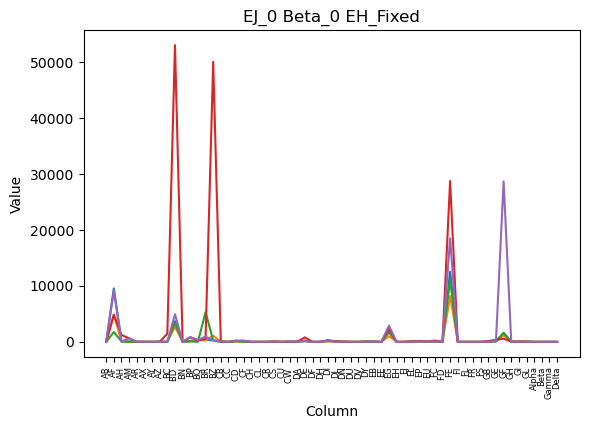

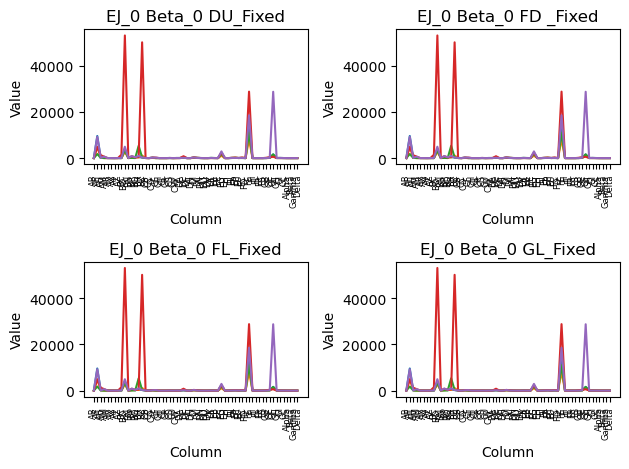

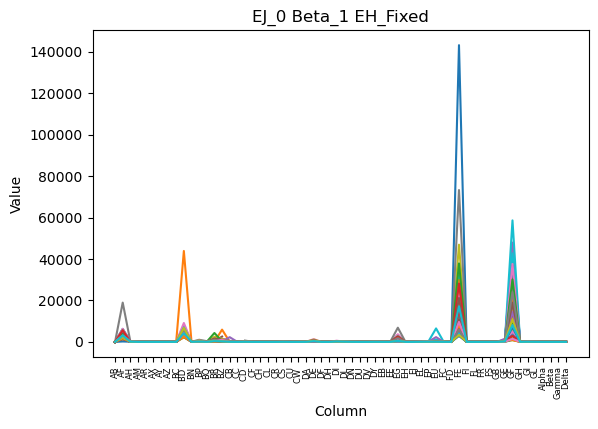

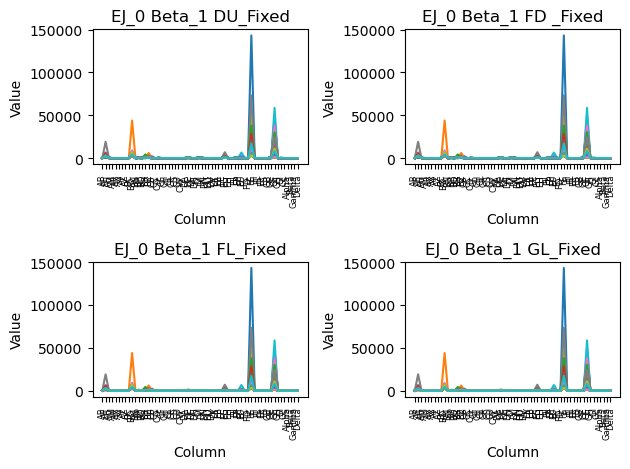

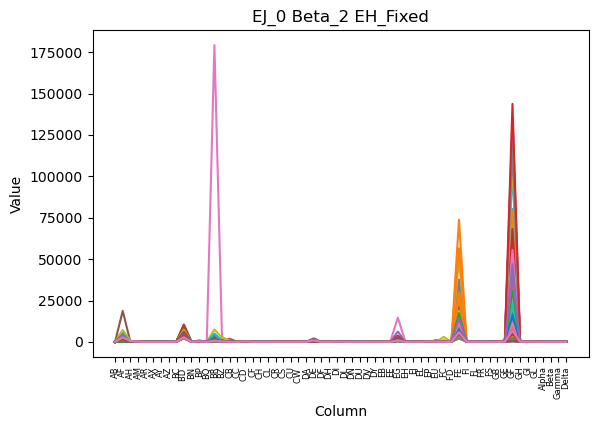

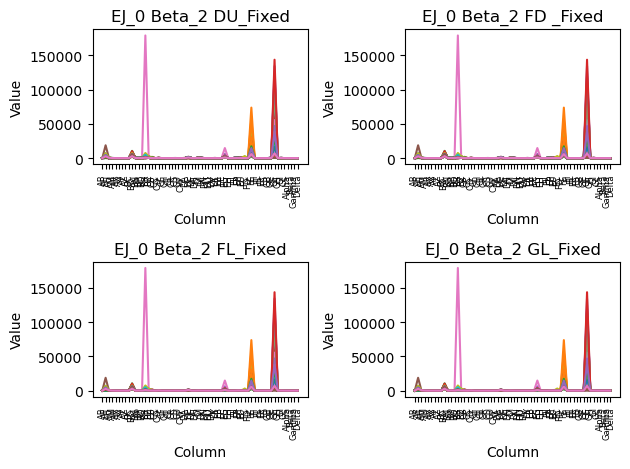

In [40]:
if visualization:
    j_plot(EJ_only_0, 'Beta', 0, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Beta', 0, 'EH')
    j_plot(EJ_only_0, 'Beta', 1, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Beta', 1, 'EH')
    j_plot(EJ_only_0, 'Beta', 2, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Beta', 2, 'EH')

### ***EJ = 0***
### ***Gamma Based***

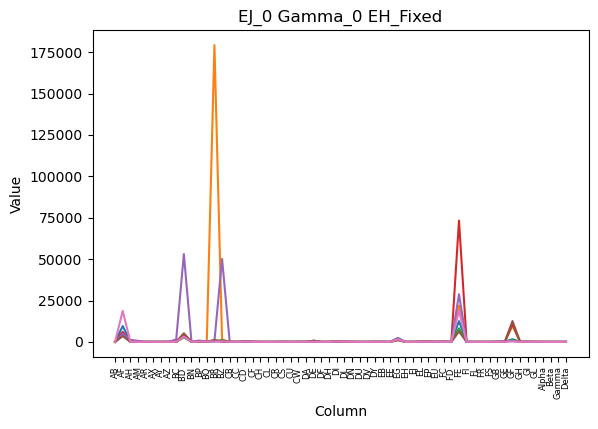

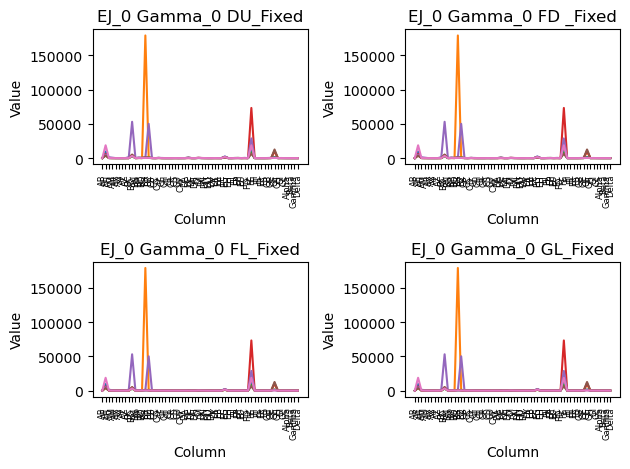

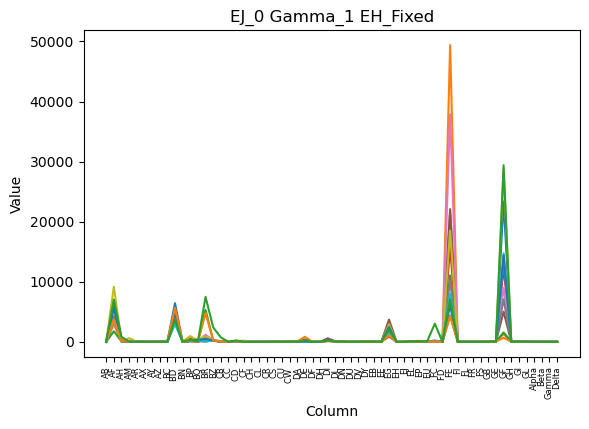

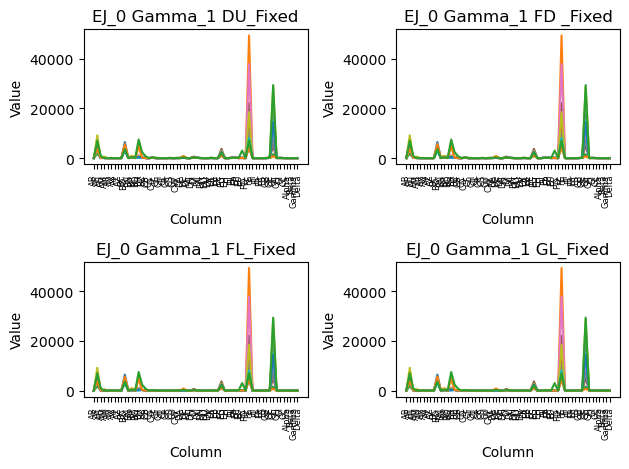

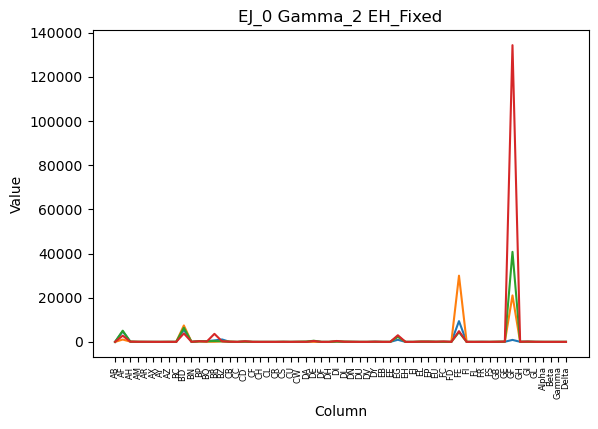

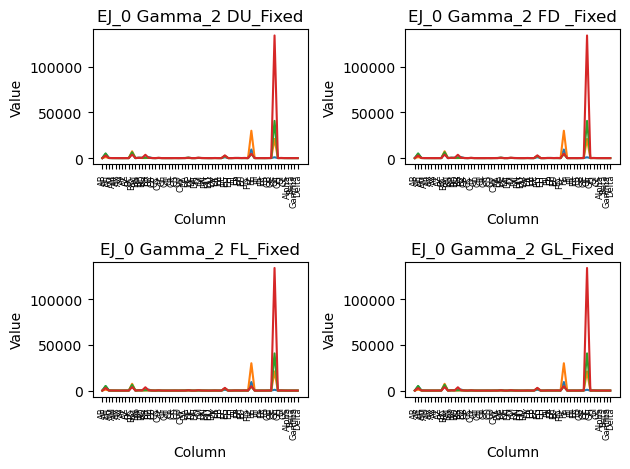

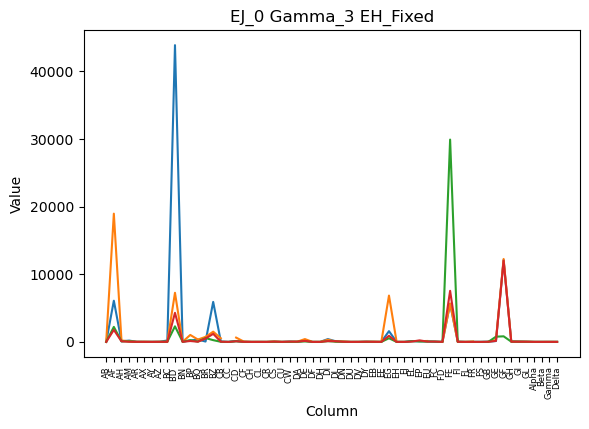

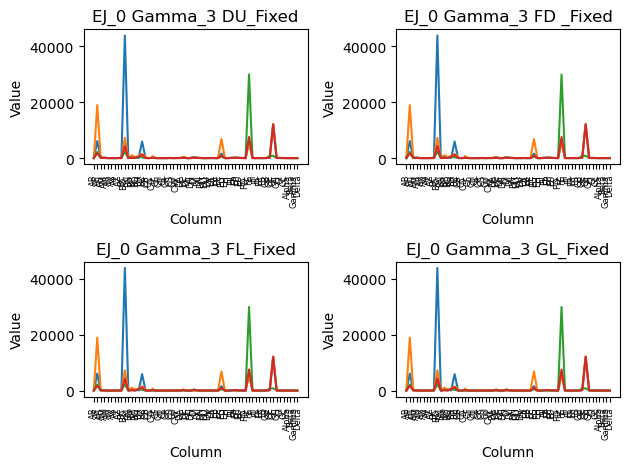

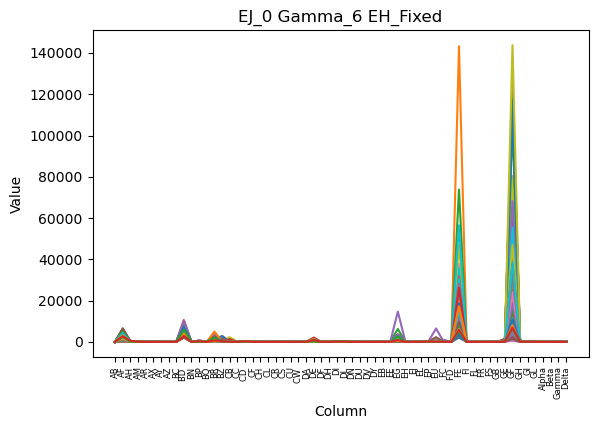

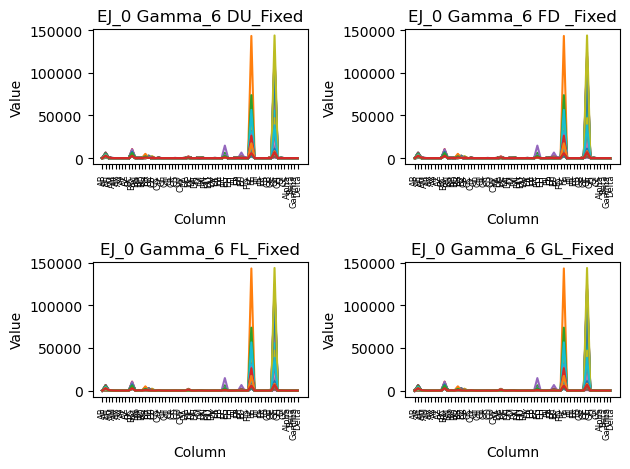

In [41]:
if visualization:
    j_plot(EJ_only_0, 'Gamma', 0, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Gamma', 0, 'EH')
    j_plot(EJ_only_0, 'Gamma', 1, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Gamma', 1, 'EH')
    j_plot(EJ_only_0, 'Gamma', 2, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Gamma', 2, 'EH')
    j_plot(EJ_only_0, 'Gamma', 3, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Gamma', 3, 'EH')
    j_plot(EJ_only_0, 'Gamma', 6, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Gamma', 6, 'EH')

### ***EJ = 0***
### ***Delta Based***

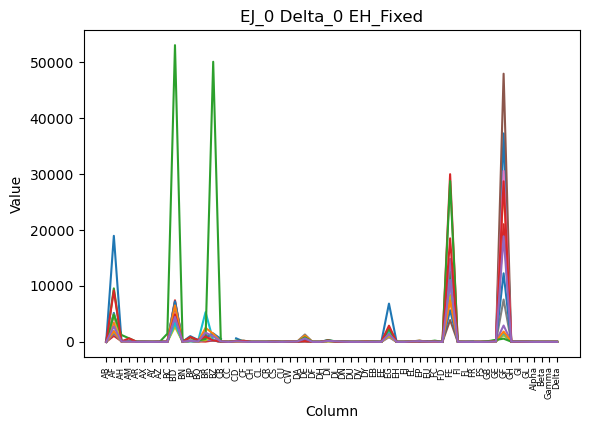

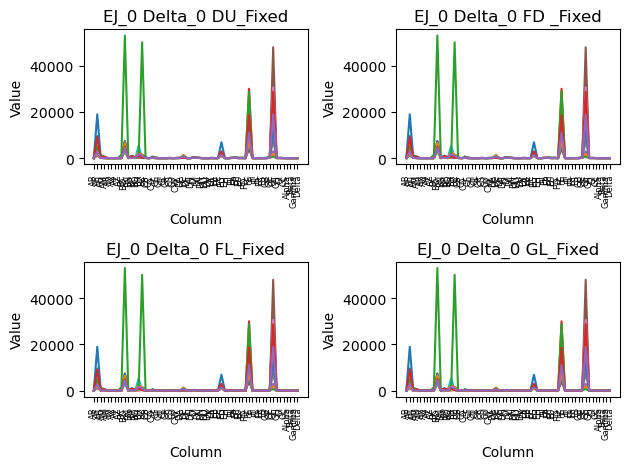

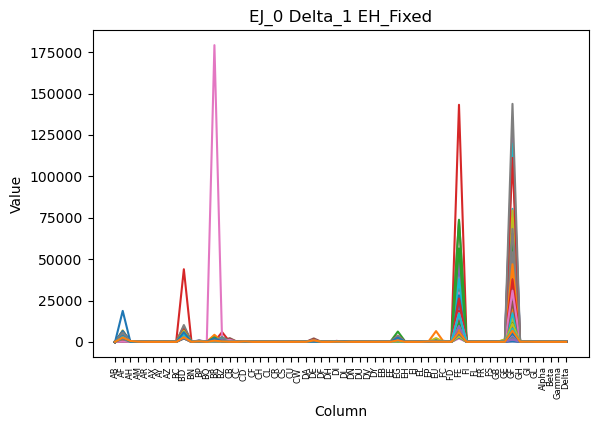

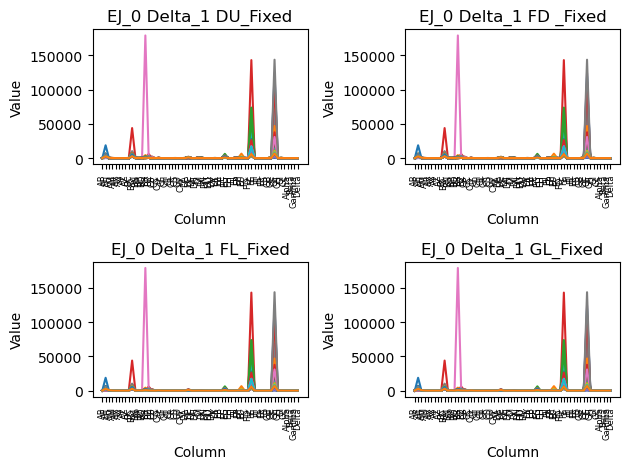

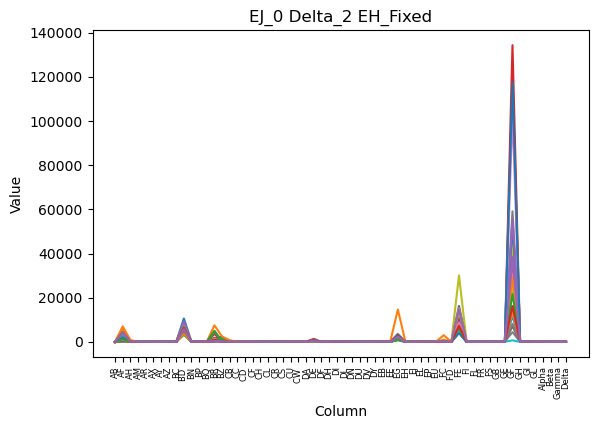

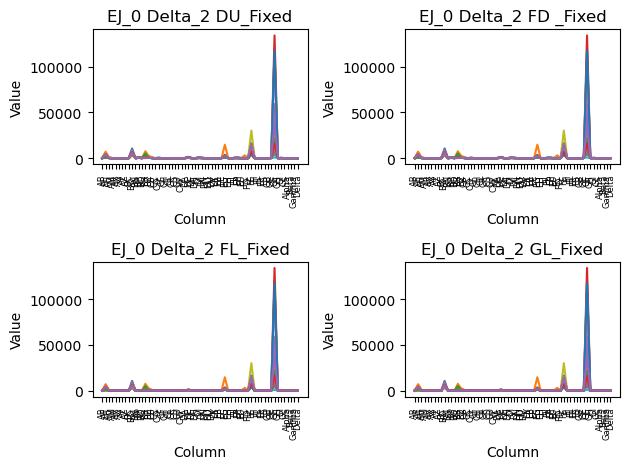

In [42]:
if visualization:
    j_plot(EJ_only_0, 'Delta', 0, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Delta', 0, 'EH')
    j_plot(EJ_only_0, 'Delta', 1, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Delta', 1, 'EH')
    j_plot(EJ_only_0, 'Delta', 2, 'EH')
    j_4_plots(EJ_only_0, the_columns, 'Delta', 2, 'EH')

### What have I found here!
***Most of them look the same, and I assume these columns are the ones that separates the classes.***<br>
I think we could consider the empty peaks (without any inner peaks) are the outliers.<br>

### Version 15 EDIT:
***Wait...*** After adding the table below, I just realized that these graphs I have above are only showing the extreme outliers.<br>
***THESE COULD BE, BUT THESE DOES NOT HAVE TO BE IMPORTANT COLUMNS***<br>
As the graphs included all columns, with different range of the value, it will obviously show similar shapes unless it has any outliers.<br>
For example: the range of column ***AB*** is in 0.081187 to 6.161666<br>
**while** the range of column ***BD*** is in 1693.62432 to 53060.59924<br>

In [43]:
column_name = []
column_min = []
column_max = []
column_min_max = []
column_median = []
column_average = []
column_stdev = []
column_mode = []

for column in train_r_com:
    if column in not_to_be_included:
        continue
    column_name.append(column)
    column_min.append(train_r_com[column].min())
    column_max.append(train_r_com[column].max())
    column_min_max.append((train_r_com[column].max()+train_r_com[column].min())/2)
    column_mode.append(train_r_com[column].mode()[0])
    column_median.append(train_r_com[column].median())
    column_average.append(np.nanmean(EJ_only_0[column]))
    column_stdev.append(train_r_com[column].std())
    
column_statistics = pd.DataFrame({'column_name' : column_name,
                                  
                                  'column_max' : column_max,
                                  'column_min' : column_min,
                                  
                                  'column_min_max_avg' : column_min_max,
                                  'column_median' : column_median,
                                  'column_average' : column_average,
                                  'column_mode' : column_mode,
                                  'column_stdev' : column_stdev
                                 })

column_statistics.set_index('column_name', inplace=True)
column_statistics = column_statistics.T
column_statistics

column_name,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,FI,FL,FR,FS,GB,GE,GF,GH,GI,GL
column_max,6.161666,28688.187660,1910.123198,630.518230,178.943634,38.270880,10.315851,38.971568,1463.693448,53060.599240,...,35.851039,137.932739,1244.227020,31.365763,135.781294,1497.351958,143790.071200,81.210825,191.194764,21.978000
column_min,0.081187,192.593280,85.200147,3.177522,8.138688,0.699861,0.025578,3.396778,1.229900,1693.624320,...,3.583450,0.173229,0.497060,0.067730,4.102182,72.611063,13.038894,9.432735,0.897628,0.001129
column_min_max_avg,3.121427,14440.390470,997.661673,316.847876,93.541161,19.485370,5.170714,21.184173,732.461674,27377.111780,...,19.717244,69.052984,622.362040,15.716747,69.941738,784.981511,71901.555047,45.321780,96.046196,10.989565
column_median,0.354659,3120.318960,85.200147,20.533110,8.138688,5.031912,0.025578,10.461320,1.229900,4997.960730,...,9.945452,3.028141,1.131000,0.250601,18.771436,72.611063,7838.273610,30.608946,41.007968,0.337827
column_average,0.439599,3136.622157,114.995499,32.228693,9.800670,5.550902,0.095618,11.220924,11.746384,5459.868335,...,9.953510,0.173229,1.534859,0.265373,20.322167,152.628540,25755.588226,31.946645,54.772107,21.978000
column_mode,0.260653,192.593280,85.200147,630.518230,8.138688,0.699861,0.025578,3.396778,1.229900,1693.624320,...,3.583450,0.173229,0.497060,0.067730,11.618198,72.611063,13.038894,9.432735,15.447432,21.978000
column_stdev,0.468388,2300.322717,127.838950,69.728226,10.518877,2.551696,0.416817,4.350645,65.166943,3021.326641,...,2.934025,11.496257,50.181948,1.305365,9.991907,144.181524,19352.959387,9.864239,36.266251,10.327010


# Figuring out which column has extreme outliers.
We can see at a glance by comparing the column_min_max_avg, column_median, column_average that most of the column has extreme outliers.<br>
This is what I will do: <br>
**First :** Find the best-possible way to fill the missing values to make the dataset complete.
* In order to do so, we need to identify the columns and rows with missing value.<br>
* Then find a rule for the column from other rows that are not missing.<br>

**Second :** Check the columns with extreme outliers if only one or two values in the column are outliers **or** if there are plenty of outliers in a column.<br>

# Finding Missing Values

In [44]:
missing_value_set = set()


for column in train_r_com:
    if train_r_com[column].isna().any():
        missing_value_set.add(column)
            
missing_value_list = list(missing_value_set)
print(f'list of missing values = {missing_value_list}')

list of missing values = ['FC', 'FL', 'GL', 'EL', 'FS', 'DU', 'BQ', 'CB', 'CC']


In [45]:
for column in list(missing_value_list):
    print(f'{column} has {train_r_com[column].isnull().sum()} missing values')

FC has 1 missing values
FL has 1 missing values
GL has 1 missing values
EL has 60 missing values
FS has 2 missing values
DU has 1 missing values
BQ has 60 missing values
CB has 2 missing values
CC has 3 missing values


### Now we know how many missing values are there in each column.
Let's go through one by one from the column that has the least missing value.<br>

#### **Column DU**
Column DU has 1 missing value, and the column's mode is 0.0055176

Therefore I wanted to check how many non-mode values are there, so that I could simply fill the missing value with mode value.

In [46]:
print(column_statistics['DU'])
print('\n' + '*' *30 + '\n')

values_other_than_mode = []
for i in train_r_com['DU']:
    if i == train_r_com['DU'].mode().values:
        continue
    else:
        values_other_than_mode.append(i)
print(f"train_r_com['DU'].mode().values = {train_r_com['DU'].mode().values}")
print()
print('number of values other than mode =', len(values_other_than_mode))

column_max            161.355315
column_min              0.005518
column_min_max_avg     80.680416
column_median           0.251741
column_average          0.005518
column_mode             0.005518
column_stdev            9.034721
Name: DU, dtype: float64

******************************

train_r_com['DU'].mode().values = [0.0055176]

number of values other than mode = 395


### Oh my Goodness

***I have been thinking about it during the weekend and below will be my attempt***
- If it will be difficult to fill the missing values.
I will first find other columns that has high + or - correlation with the missing value column. <br>
Then find the rows that has similar high correlated column values with the missing value row. <br>
It is quite confusing to put it in words, below is the code (it will make more sense)<br>

In [47]:
for i in range(len(train_r_com['DU'])):
#     print(i)
    if np.isnan(train_r_com['DU'][i]) == True:
        print('Row with missing DU =', i)
    else:
        continue

Row with missing DU = 594


#### Now we know that Row #594 has missing column 'DU'.
What I have to do now is to find columns that has high correlations with column 'DU'.

In [48]:
du_corr = pd.DataFrame(train_r_com[train_r_com.columns[:]].corr()['DU']).rename(columns={'DU':'correlations'})

for i in range(len(du_corr)):
    if du_corr['correlations'][i] == 1:
        continue
    elif du_corr['correlations'][i] > 0.8:
        print('high_corr', du_corr.iloc[i])
        print()
    elif du_corr['correlations'][i] < -0.8:
        print('low_corr', du_corr.iloc[i])
        print()
    else:
        continue
        
print('Row 594 EH =', train_r_com['EH'][594])
print('Row 594 FD =', train_r_com['FD '][594])

high_corr correlations    0.850957
Name: EH, dtype: float64

high_corr correlations    0.805989
Name: FD , dtype: float64

Row 594 EH = 0.006084
Row 594 FD = 2.719146


#### Column 'EH' and 'FD' has high correlation with column 'DU'<br>
*I think I can use them to figure out the missing 'DU' in row 594*

In [49]:
for row_idx in range(len(train_r_com['EH'])):
    if row_idx == 594:
        continue
    if train_r_com['EH'][row_idx] < (train_r_com['EH'][594] * 1.05) and train_r_com['EH'][row_idx] > (train_r_com['EH'][594] * 0.95):
        print("row_idx =", [row_idx])
        print(f"train_r_com['EH'][{row_idx}] =",train_r_com['EH'][row_idx])
        print(f"train_r_com['DU'][{row_idx}] =",train_r_com['DU'][row_idx])
        print()
    

row_idx = [15]
train_r_com['EH'][15] = 0.006084
train_r_com['DU'][15] = 0.268983

row_idx = [18]
train_r_com['EH'][18] = 0.006084
train_r_com['DU'][18] = 0.372438

row_idx = [41]
train_r_com['EH'][41] = 0.006084
train_r_com['DU'][41] = 0.006897

row_idx = [45]
train_r_com['EH'][45] = 0.006084
train_r_com['DU'][45] = 0.151734

row_idx = [76]
train_r_com['EH'][76] = 0.006084
train_r_com['DU'][76] = 1.703559

row_idx = [79]
train_r_com['EH'][79] = 0.006084
train_r_com['DU'][79] = 0.062073

row_idx = [110]
train_r_com['EH'][110] = 0.006084
train_r_com['DU'][110] = 0.006897

row_idx = [146]
train_r_com['EH'][146] = 0.006084
train_r_com['DU'][146] = 0.48279

row_idx = [249]
train_r_com['EH'][249] = 0.006084
train_r_com['DU'][249] = 3.627822

row_idx = [288]
train_r_com['EH'][288] = 0.006084
train_r_com['DU'][288] = 1.717353

row_idx = [338]
train_r_com['EH'][338] = 0.006084
train_r_com['DU'][338] = 0.006897

row_idx = [348]
train_r_com['EH'][348] = 0.006084
train_r_com['DU'][348] = 0.006897


In [50]:
for row_idx in range(len(train_r_com['FD '])):
    if row_idx == 594:
        continue
    if train_r_com['FD '][row_idx] < (train_r_com['FD '][594] * 1.05) and train_r_com['FD '][row_idx] > (train_r_com['FD '][594] * 0.95):
        print("row_idx =", [row_idx])
        print(f"train_r_com['FD'][{row_idx}] =",train_r_com['FD '][row_idx])
        print(f"train_r_com['DU'][{row_idx}] =",train_r_com['DU'][row_idx])
        print()

row_idx = [15]
train_r_com['FD'][15] = 2.719146
train_r_com['DU'][15] = 0.268983

row_idx = [78]
train_r_com['FD'][78] = 2.636028
train_r_com['DU'][78] = 0.524172

row_idx = [148]
train_r_com['FD'][148] = 2.778516
train_r_com['DU'][148] = 1.469061

row_idx = [230]
train_r_com['FD'][230] = 2.725083
train_r_com['DU'][230] = 0.006897

row_idx = [271]
train_r_com['FD'][271] = 2.831949
train_r_com['DU'][271] = 0.365541

row_idx = [347]
train_r_com['FD'][347] = 2.742894
train_r_com['DU'][347] = 0.006897

row_idx = [377]
train_r_com['FD'][377] = 2.707272
train_r_com['DU'][377] = 0.441408

row_idx = [419]
train_r_com['FD'][419] = 2.843823
train_r_com['DU'][419] = 1.055241

row_idx = [422]
train_r_com['FD'][422] = 2.778516
train_r_com['DU'][422] = 0.806949

row_idx = [452]
train_r_com['FD'][452] = 2.701335
train_r_com['DU'][452] = 1.807014

row_idx = [562]
train_r_com['FD'][562] = 2.641965
train_r_com['DU'][562] = 0.558657

row_idx = [568]
train_r_com['FD'][568] = 2.689461
train_r_com['DU'][568

### Version 25 Edit ->
I decided to change the range from definite number to percentage.<br>
As there are number of rows that has the same value with the row 594, I will average them and fill train_r_com['DU'][594].

In [51]:
Sum_DU = 0
count = 0
for row_idx in range(len(train_r_com['EH'])):
    if row_idx == 594:
        continue
    if train_r_com['EH'][row_idx] == (train_r_com['EH'][594]):
        Sum_DU += train_r_com['DU'][row_idx]
        count += 1
        
for row_idx in range(len(train_r_com['FD '])):
    if row_idx == 594:
        continue
    if train_r_com['FD '][row_idx] == (train_r_com['FD '][594]):
        Sum_DU += train_r_com['DU'][row_idx]
        count += 1

du_594 = Sum_DU/count
train_r_com['DU'] = train_r_com['DU'].fillna(du_594)
print(train_r_com['DU'][594])
train_r_com['DU'].isna().values.any()

0.6161320000000001


False

***For other columns, I will use below correlations to fill-in the missing value.***

***From here, we could see that there are no columns that has high correlation with the column 'EL'.***<br>
So dropping column 'EL' would be reasonable enough.

In [52]:
train_r_com = train_r_com.drop(columns='EL')
train_r_com.columns

Index(['AB', 'AF', 'AH', 'AM', 'AR', 'AX', 'AY', 'AZ', 'BC', 'BD ', 'BN', 'BP',
       'BQ', 'BR', 'BZ', 'CB', 'CC', 'CD ', 'CF', 'CH', 'CL', 'CR', 'CS', 'CU',
       'CW ', 'DA', 'DE', 'DF', 'DH', 'DI', 'DL', 'DN', 'DU', 'DV', 'DY', 'EB',
       'EE', 'EG', 'EH', 'EJ', 'EP', 'EU', 'FC', 'FD ', 'FE', 'FI', 'FL', 'FR',
       'FS', 'GB', 'GE', 'GF', 'GH', 'GI', 'GL', 'Alpha', 'Beta', 'Gamma',
       'Delta'],
      dtype='object')

## Column CC

alpha_only_3 - 'AB, 'BC', 'BZ', 'GB', 'GE'<br>
beta_only_0 - 'AB', 'AH', 'BC', 'BD', 'BZ', 'CL', 'DE'<br>
gamma_only_0 - 'AB', 'AH', 'AM', 'AR', 'AX', 'BC', 'BD', 'BP', 'BZ', 'CF', 'GB', 'GE'<br>
gamma_only_2 - 'BC', 'CW', 'EH', 'GB'<br>
delta_only_0 - 'AH', 'BC', 'BD', 'BZ'

***Fortunatley, column Delta value of row 330 is 0! We can finally do something! :))***

In [53]:
train_r_com[train_r_com['CC'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta
24,0.158101,3257.64549,138.368592,8.640630,18.385464,4.146012,0.182700,4.099451,7.836220,3633.584335,...,8.311337,72.611063,1884.728169,48.039971,37.160256,21.978,0,1,6,1
114,0.170920,1963.64850,85.200147,22.574033,8.138688,2.595687,0.029232,3.396778,1.229900,7958.583320,...,25.636312,198.146620,6926.005926,25.287916,73.265992,21.978,0,2,6,1
330,6.161666,18964.47278,210.557493,85.393581,8.138688,17.983770,0.032886,8.866914,6.767964,7259.050830,...,31.636102,296.036174,12261.844150,49.586046,39.457052,21.978,2,1,3,0


***There are 75 rows that Delta == 0!***<br>
Hopefully I can find something here!

In [54]:
len(train_r_com[(train_r_com['Delta'] == 0)])

75

***Below are each value of row 330 of high correlated columns***

In [55]:
train_col_list = [i for i in train_r_com]

In [56]:
pd.DataFrame([train_r_com.iat[330, train_col_list.index('AH')],
             train_r_com.iat[330, train_col_list.index('BC')],
             train_r_com.iat[330, train_col_list.index('BD ')],
             train_r_com.iat[330, train_col_list.index('BZ')]]
            ).T.rename(columns={0:'AH',
                                1:'BC',
                                2:'BD',
                                3:'BZ'
                               })

,AH,BC,BD,BZ
0,210.557493,6.767964,7259.05083,1510.069965


***Well, it seems like 330 is the only column that matches all the condition***

In [57]:
pd.DataFrame([train_r_com[(train_r_com['Delta'] == 0) &
                          (train_r_com['AH'] < train_r_com['AH'][330] * 1.05) &
                          (train_r_com['AH'] > train_r_com['AH'][330] * 0.95) &
                          (train_r_com['BC'] < train_r_com['BC'][330] * 1.05) &
                          (train_r_com['BC'] > train_r_com['BC'][330] * 0.95) &
                          (train_r_com['BD '] < train_r_com['BD '] * 1.05) &
                          (train_r_com['BD '] > train_r_com['BD '] * 0.95) &
                          (train_r_com['BZ'] < train_r_com['BZ'][330] * 1.05) &
                          (train_r_com['BZ'] > train_r_com['BZ'][330] * 0.95)]['AH'],
             train_r_com[(train_r_com['Delta'] == 0) &
                         (train_r_com['AH'] < train_r_com['AH'][330] * 1.05) &
                         (train_r_com['AH'] > train_r_com['AH'][330] * 0.95) &
                         (train_r_com['BC'] < train_r_com['BC'][330] * 1.05) &
                         (train_r_com['BC'] > train_r_com['BC'][330] * 0.95) &
                         (train_r_com['BD '] < train_r_com['BD '] * 1.05) &
                         (train_r_com['BD '] > train_r_com['BD '] * 0.95) &
                         (train_r_com['BZ'] < train_r_com['BZ'][330] * 1.05) &
                         (train_r_com['BZ'] > train_r_com['BZ'][330] * 0.95)]['BC'],
             train_r_com[(train_r_com['Delta'] == 0) &
                         (train_r_com['AH'] < train_r_com['AH'][330] * 1.05) &
                         (train_r_com['AH'] > train_r_com['AH'][330] * 0.95) &
                         (train_r_com['BC'] < train_r_com['BC'][330] * 1.05) &
                         (train_r_com['BC'] > train_r_com['BC'][330] * 0.95) &
                         (train_r_com['BD '] < train_r_com['BD '] * 1.05) &
                         (train_r_com['BD '] > train_r_com['BD '] * 0.95) &
                         (train_r_com['BZ'] < train_r_com['BZ'][330] * 1.05) &
                         (train_r_com['BZ'] > train_r_com['BZ'][330] * 0.95)]['BD '],
             train_r_com[(train_r_com['Delta'] == 0) &
                         (train_r_com['AH'] < train_r_com['AH'][330] * 1.05) &
                         (train_r_com['AH'] > train_r_com['AH'][330] * 0.95) &
                         (train_r_com['BC'] < train_r_com['BC'][330] * 1.05) &
                         (train_r_com['BC'] > train_r_com['BC'][330] * 0.95) &
                         (train_r_com['BD '] < train_r_com['BD '] * 1.05) &
                         (train_r_com['BD '] > train_r_com['BD '] * 0.95) &
                         (train_r_com['BZ'] < train_r_com['BZ'][330] * 1.05) &
                         (train_r_com['BZ'] > train_r_com['BZ'][330] * 0.95)]['BZ']
             ]).T

,AH,BC,BD,BZ
330,210.557493,6.767964,7259.05083,1510.069965


Let's try to find the most similar columns.<br>
***From the logic below, we knew that column 'AH' 'BZ' of row 330 exceeds the limit***<br>
I will exclude them to have more options to take a look on.<br>

In [58]:
finding_CC_row_330 = ['AH', 'BC', 'BD ', 'BZ']

for column in finding_CC_row_330:
    if column in not_to_be_included:
        continue
    Q1, Q3 = np.percentile(train_r_com[column], [25, 75])
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    display(f'{column} lower limit = {lower_limit}')
    display(f'{column} upper limit = {upper_limit}')
    print()


'AH lower limit = 42.391057499999995'

'AH upper limit = 156.5486295'

'BC lower limit = -4.547116'

'BC upper limit = 10.85826'

'BD  lower limit = 1335.4286250000005'

'BD  upper limit = 8856.159945'

'BZ lower limit = 257.432377'

'BZ upper limit = 257.432377'

***As I have 77 rows with high correlation,<br> I will fill out the Column CC of Row 330 with an average of CC value of these 75 rows***

In [59]:
Alphabet = 'CC'
row = 330
Sum = 0
count = 0

for column in finding_CC_row_330:
    for row_idx in range(len(train_r_com[column])):
        if row_idx == row:
            continue
        if train_r_com['Delta'][row] == 0:
            if train_r_com[column][row_idx] < train_r_com[column][row] * 1.05:
                if train_r_com[column][row_idx] > train_r_com[column][row] * 0.95:        
                    Sum += train_r_com[Alphabet][row_idx]
                    count += 1

print(count)
print(Sum)
sum_col = Sum/count
train_r_com[Alphabet][row] = sum_col
print(train_r_com[Alphabet][row])

69
45.704358899999995
0.6623820130434782


In [60]:
def same_values(df, columnss):
    remaining = df[df[columnss].isna()==True]
    print(remaining)
    same = []
    value = []
    
    if len(remaining.index) == 1:
        for column in remaining:
            same.append(column)
            value.append(remaining[column].iloc[0])

    else:
        for column in remaining:
            temp = []
            for idx in range(len(remaining[columnss])):
                if idx == range(len(remaining[columnss]))[-1]:
                    continue
                if remaining[column].iloc[idx] in temp:
                    same.append(column)
                    value.append(remaining[column].iloc[idx])
                else:
                    temp.append(remaining[column].iloc[idx])
                    same.append(column)
                    value.append(remaining[column].iloc[idx])

    same_value = pd.DataFrame([value], columns=same)
    print(same_value)
    return same_value

In [61]:
def sum_columns(df, row, alphabet):
    Sum = 0
    done_row = []
    same_value = same_values(df, alphabet)
    
    for row_idx in range(len(df.columns)):
        if row_idx in row:
            row_idx == row
            continue

        for column in same_value:
            if row_idx in done_row:
                continue
            if df[column].iloc[row_idx] == same_value[column].iloc[0]:
                Sum += train_r_com[alphabet][row_idx]
                done_row.append(row_idx)

    sum_col = Sum/len(done_row)
    return sum_col

### How should I then find missing values for remaining 2 rows?
As both have the same value for Gamma and Delta, we could use them to find.<br>
Or we can also use Beta, finding missing value one by one.

In [62]:
Alphabet = 'CC'
row = [24, 114]

sum_col = sum_columns(train_r_com, row, Alphabet)
print('CC sum_col =', sum_col)

           AB          AF          AH         AM         AR        AX  \
24   0.158101  3257.64549  138.368592   8.640630  18.385464  4.146012   
114  0.170920  1963.64850   85.200147  22.574033   8.138688  2.595687   

           AY        AZ       BC          BD   ...         GB          GE  \
24   0.182700  4.099451  7.83622  3633.584335  ...   8.311337   72.611063   
114  0.029232  3.396778  1.22990  7958.583320  ...  25.636312  198.146620   

              GF         GH         GI      GL  Alpha  Beta  Gamma  Delta  
24   1884.728169  48.039971  37.160256  21.978      0     1      6      1  
114  6926.005926  25.287916  73.265992  21.978      0     2      6      1  

[2 rows x 59 columns]
         AB          AF          AH       AM         AR        AX      AY  \
0  0.158101  3257.64549  138.368592  8.64063  18.385464  4.146012  0.1827   

         AZ       BC          BD   ...        GB         GE           GF  \
0  4.099451  7.83622  3633.584335  ...  8.311337  72.611063  1884.

In [63]:
train_r_com[Alphabet] = train_r_com[Alphabet].fillna(sum_col)
print(f'train_r_com[Alphabet][row] = \n{train_r_com[Alphabet][row]}')

train_r_com[Alphabet][row] = 
24     0.645764
114    0.645764
Name: CC, dtype: float64


In [64]:
train_r_com[train_r_com['CC'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta


## Column CB

alpha_only_2 - 'AB', 'CD', 'CF', 'EG'<br>
alpha_only_3 - 'EE'<br>
gamma_only_0 - 'FR'<br>
gamma_only_1 - 'AH', 'BZ', 'CH', 'FC'<br>
gamma_only_2 - 'AZ', 'CB'<br>
gamma_only_3 - 'AB', 'AF'<br>
gamma_only_4 - 'BQ'<br>
delta_only_2 - 'AH'<br>

### Luckily or not,<br>
***Greek value of the both row that has missing column 'CB' are not in the list above :)***<br>
So I will use the same logic that I used for Column 'CC' row 24 and 114.

In [65]:
train_r_com[train_r_com['CB'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta
24,0.158101,3257.64549,138.368592,8.640630,18.385464,4.146012,0.182700,4.099451,7.83622,3633.584335,...,8.311337,72.611063,1884.728169,48.039971,37.160256,21.978,0,1,6,1
114,0.170920,1963.64850,85.200147,22.574033,8.138688,2.595687,0.029232,3.396778,1.22990,7958.583320,...,25.636312,198.146620,6926.005926,25.287916,73.265992,21.978,0,2,6,1


In [66]:
Alphabet = 'CB'
row = [24, 114]
sum_col = sum_columns(train_r_com, row, Alphabet)
sum_col

           AB          AF          AH         AM         AR        AX  \
24   0.158101  3257.64549  138.368592   8.640630  18.385464  4.146012   
114  0.170920  1963.64850   85.200147  22.574033   8.138688  2.595687   

           AY        AZ       BC          BD   ...         GB          GE  \
24   0.182700  4.099451  7.83622  3633.584335  ...   8.311337   72.611063   
114  0.029232  3.396778  1.22990  7958.583320  ...  25.636312  198.146620   

              GF         GH         GI      GL  Alpha  Beta  Gamma  Delta  
24   1884.728169  48.039971  37.160256  21.978      0     1      6      1  
114  6926.005926  25.287916  73.265992  21.978      0     2      6      1  

[2 rows x 59 columns]
         AB          AF          AH       AM         AR        AX      AY  \
0  0.158101  3257.64549  138.368592  8.64063  18.385464  4.146012  0.1827   

         AZ       BC          BD   ...        GB         GE           GF  \
0  4.099451  7.83622  3633.584335  ...  8.311337  72.611063  1884.

60.72010380172414

In [67]:
train_r_com[Alphabet] = train_r_com[Alphabet].fillna(sum_col)
print(f'train_r_com[Alphabet][row] = \n{train_r_com[Alphabet][row]}')

train_r_com[Alphabet][row] = 
24     60.720104
114    60.720104
Name: CB, dtype: float64


In [68]:
train_r_com[train_r_com['CB'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta


## Column FC
beta_only_0 - 'DE'<br>
gamma_only_0 - '***AH***', 'BC', 'BD', 'BP', '***BZ***', 'CF', 'EB', 'GB', 'GE'<br>
gamma_only_1 - '***AH***', '***BZ***', 'CB', 'CH', 'FC'<br>
gamma_only_2 - 'AR', 'BR', 'CD', 'CL', 'DI', 'EE'<br>
gamma_only_4 - 'AB'<br>
delta_only_2 - '***AH***'<br>

For Column FC as well, we have no greek letter matching.<br>
So I will use the same logic to fill in the missing value.

In [69]:
train_r_com[train_r_com['FC'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta
330,6.161666,18964.47278,210.557493,85.393581,8.138688,17.98377,0.032886,8.866914,6.767964,7259.05083,...,31.636102,296.036174,12261.84415,49.586046,39.457052,21.978,2,1,3,0


In [70]:
Alphabet = 'FC'
row = [330]

sum_col = sum_columns(train_r_com, row, Alphabet)
sum_col

           AB           AF          AH         AM        AR        AX  \
330  6.161666  18964.47278  210.557493  85.393581  8.138688  17.98377   

           AY        AZ        BC         BD   ...         GB          GE  \
330  0.032886  8.866914  6.767964  7259.05083  ...  31.636102  296.036174   

              GF         GH         GI      GL  Alpha  Beta  Gamma  Delta  
330  12261.84415  49.586046  39.457052  21.978      2     1      3      0  

[1 rows x 59 columns]
         AB           AF          AH         AM        AR        AX        AY  \
0  6.161666  18964.47278  210.557493  85.393581  8.138688  17.98377  0.032886   

         AZ        BC         BD   ...         GB          GE           GF  \
0  8.866914  6.767964  7259.05083  ...  31.636102  296.036174  12261.84415   

          GH         GI      GL  Alpha  Beta  Gamma  Delta  
0  49.586046  39.457052  21.978      2     1      3      0  

[1 rows x 59 columns]


84.42030703448279

In [71]:
train_r_com[Alphabet] = train_r_com[Alphabet].fillna(sum_col)
print(f'train_r_com[Alphabet][row] = \n{train_r_com[Alphabet][row]}')

train_r_com[Alphabet][row] = 
330    84.420307
Name: FC, dtype: float64


In [72]:
train_r_com[train_r_com['FC'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta


## Column FL
alpha_only_1 - '***DU***', '***FD***'<br>
beta_only_0 - 'AX', 'BP', 'CR', 'DN', '***FD***', 'GH'
beta_only_1 - '***DU***'<br>
gamma_only_0 - '***FD***' <br>
gamma_only_1 - '***EH***', '***FD***'<br>
gamma_only_2 - '***DU***', '***FD***' <br>
gamma_only_3 - '***FD***' <br>
gamma_only_5 - '***DU***', '***FD***' <br>
gamma_only_7 - 'AM', '***DF***' <br>
delta_only_2 - '***DU***', '***EH***', '***FD***'<br>

Same logic goes for Column FL!

In [73]:
train_r_com[train_r_com['FL'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta
594,0.670861,5501.73569,93.822057,6.993026,8.138688,6.511365,0.025578,9.541228,1.2299,4126.61927,...,37.310322,143.490662,1849.552461,31.371751,10.04366,NaN,0,2,6,1


In [74]:
Alphabet = 'FL'
row = [594]

sum_col = sum_columns(train_r_com, row, Alphabet)
sum_col


           AB          AF         AH        AM        AR        AX        AY  \
594  0.670861  5501.73569  93.822057  6.993026  8.138688  6.511365  0.025578   

           AZ      BC         BD   ...         GB          GE           GF  \
594  9.541228  1.2299  4126.61927  ...  37.310322  143.490662  1849.552461   

            GH        GI  GL  Alpha  Beta  Gamma  Delta  
594  31.371751  10.04366 NaN      0     2      6      1  

[1 rows x 59 columns]
         AB          AF         AH        AM        AR        AX        AY  \
0  0.670861  5501.73569  93.822057  6.993026  8.138688  6.511365  0.025578   

         AZ      BC         BD   ...         GB          GE           GF  \
0  9.541228  1.2299  4126.61927  ...  37.310322  143.490662  1849.552461   

          GH        GI  GL  Alpha  Beta  Gamma  Delta  
0  31.371751  10.04366 NaN      0     2      6      1  

[1 rows x 59 columns]


7.803154532322033

In [75]:
train_r_com[Alphabet] = train_r_com[Alphabet].fillna(sum_col)
print(f'train_r_com[Alphabet][row] = \n{train_r_com[Alphabet][row]}')

train_r_com[Alphabet][row] = 
594    7.803155
Name: FL, dtype: float64


In [76]:
train_r_com[train_r_com['FL'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta


## Column FS
alpha_only_2 - '***BP***'<br>
gamma_only_3 - 'AX', '***BP***', '***EB***', 'GB', 'GI'<br>
gamma_only_4 - 'DN', '***EB***', 'EG' 'EU

Yes!! We got column 330 that has matching Alpha and Gamma!

In [77]:
train_r_com[train_r_com['FS'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta
330,6.161666,18964.47278,210.557493,85.393581,8.138688,17.983770,0.032886,8.866914,6.767964,7259.05083,...,31.636102,296.036174,12261.844150,49.586046,39.457052,21.978000,2,1,3,0
562,0.478576,7643.98140,116.953161,33.645808,8.204238,8.876718,0.025578,11.828854,1.229900,5883.87595,...,25.766540,191.971654,4833.383724,25.113029,40.025464,0.007333,0,2,6,1


In [78]:
len(train_r_com[(train_r_com['Alpha'] == 2) | (train_r_com['Gamma'] == 3)])

18

In [79]:
train_col_list = [i for i in train_r_com]
pd.DataFrame([train_r_com.iat[330, train_col_list.index('AX')],
             train_r_com.iat[330, train_col_list.index('BP')],
             train_r_com.iat[330, train_col_list.index('EB')],
             train_r_com.iat[330, train_col_list.index('GB')],
             train_r_com.iat[330, train_col_list.index('GI')]]
            ).T.rename(columns={0:'AX',
                                1:'BP',
                                2:'EB',
                                3:'GB',
                                4:'GI'
                               })

,AX,BP,EB,GB,GI
0,17.98377,1027.410669,27.713628,31.636102,39.457052


In [80]:
pd.DataFrame([train_r_com[(train_r_com['Alpha'] == 2) &
                          (train_r_com['BP'] < train_r_com['BP'][330] * 1.05) &
                          (train_r_com['BP'] > train_r_com['BP'][330] * 0.95)]['BP']]).T

,BP
330,1027.410669


In [81]:
pd.DataFrame([train_r_com[(train_r_com['Gamma'] == 3) &
                          (train_r_com['AX'] < train_r_com['AX'][330] * 1.05) &
                          (train_r_com['AX'] > train_r_com['AX'][330] * 0.95) &
                          (train_r_com['BP'] < train_r_com['BP'][330] * 1.05) &
                          (train_r_com['BP'] > train_r_com['BP'][330] * 0.95) &
                          (train_r_com['EB'] < train_r_com['EB'] * 1.05) &
                          (train_r_com['EB'] > train_r_com['EB'] * 0.95) &
                          (train_r_com['GB'] < train_r_com['GB'][330] * 1.05) &
                          (train_r_com['GB'] > train_r_com['GB'][330] * 0.95) &
                          (train_r_com['GI'] < train_r_com['GI'][330] * 1.05) &
                          (train_r_com['GI'] > train_r_com['GI'][330] * 0.95)]['AX'],
             train_r_com[(train_r_com['Gamma'] == 3) &
                         (train_r_com['AX'] < train_r_com['AX'][330] * 1.05) &
                         (train_r_com['AX'] > train_r_com['AX'][330] * 0.95) &
                         (train_r_com['BP'] < train_r_com['BP'][330] * 1.05) &
                         (train_r_com['BP'] > train_r_com['BP'][330] * 0.95) &
                         (train_r_com['EB'] < train_r_com['EB'] * 1.05) &
                         (train_r_com['EB'] > train_r_com['EB'] * 0.95) &
                         (train_r_com['GB'] < train_r_com['GB'][330] * 1.05) &
                         (train_r_com['GB'] > train_r_com['GB'][330] * 0.95) &
                         (train_r_com['GI'] < train_r_com['GI'][330] * 1.05) &
                         (train_r_com['GI'] > train_r_com['GI'][330] * 0.95)]['BP'],
             train_r_com[(train_r_com['Gamma'] == 3) &
                         (train_r_com['AX'] < train_r_com['AX'][330] * 1.05) &
                         (train_r_com['AX'] > train_r_com['AX'][330] * 0.95) &
                         (train_r_com['BP'] < train_r_com['BP'][330] * 1.05) &
                         (train_r_com['BP'] > train_r_com['BP'][330] * 0.95) &
                         (train_r_com['EB'] < train_r_com['EB'] * 1.05) &
                         (train_r_com['EB'] > train_r_com['EB'] * 0.95) &
                         (train_r_com['GB'] < train_r_com['GB'][330] * 1.05) &
                         (train_r_com['GB'] > train_r_com['GB'][330] * 0.95) &
                         (train_r_com['GI'] < train_r_com['GI'][330] * 1.05) &
                         (train_r_com['GI'] > train_r_com['GI'][330] * 0.95)]['EB'],
             train_r_com[(train_r_com['Gamma'] == 3) &
                         (train_r_com['AX'] < train_r_com['AX'][330] * 1.05) &
                         (train_r_com['AX'] > train_r_com['AX'][330] * 0.95) &
                         (train_r_com['BP'] < train_r_com['BP'][330] * 1.05) &
                         (train_r_com['BP'] > train_r_com['BP'][330] * 0.95) &
                         (train_r_com['EB'] < train_r_com['EB'] * 1.05) &
                         (train_r_com['EB'] > train_r_com['EB'] * 0.95) &
                         (train_r_com['GB'] < train_r_com['GB'][330] * 1.05) &
                         (train_r_com['GB'] > train_r_com['GB'][330] * 0.95) &
                         (train_r_com['GI'] < train_r_com['GI'][330] * 1.05) &
                         (train_r_com['GI'] > train_r_com['GI'][330] * 0.95)]['GB'],
              train_r_com[(train_r_com['Gamma'] == 3) &
                         (train_r_com['AX'] < train_r_com['AX'][330] * 1.05) &
                         (train_r_com['AX'] > train_r_com['AX'][330] * 0.95) &
                         (train_r_com['BP'] < train_r_com['BP'][330] * 1.05) &
                         (train_r_com['BP'] > train_r_com['BP'][330] * 0.95) &
                         (train_r_com['EB'] < train_r_com['EB'] * 1.05) &
                         (train_r_com['EB'] > train_r_com['EB'] * 0.95) &
                         (train_r_com['GB'] < train_r_com['GB'][330] * 1.05) &
                         (train_r_com['GB'] > train_r_com['GB'][330] * 0.95) &
                         (train_r_com['GI'] < train_r_com['GI'][330] * 1.05) &
                         (train_r_com['GI'] > train_r_com['GI'][330] * 0.95)]['GI']
             ]).T

,AX,BP,EB,GB,GI
330,17.98377,1027.410669,27.713628,31.636102,39.457052


In [82]:
finding_FS_row_330 = ['AX', 'BP', 'EB', 'GB', 'GI']

for column in finding_FS_row_330:
    if column in not_to_be_included:
        continue
    Q1, Q3 = np.percentile(train_r_com[column], [25, 75])
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    display(f'{column} lower limit = {lower_limit}')
    display(f'{column} upper limit = {upper_limit}')
    print()


'AX lower limit = 0.6732840000000011'

'AX upper limit = 9.886643999999999'

'BP lower limit = 20.412904500000025'

'BP upper limit = 384.23779649999994'

'EB lower limit = -0.8410920000000006'

'EB upper limit = 17.309532'

'GB lower limit = -3.3208139999999986'

'GB upper limit = 42.965937999999994'

'GI lower limit = -44.36828599999998'

'GI upper limit = 135.31163399999997'

In [83]:
Alphabet = 'FS'
row = 330
Sum = 0
count = 0
done_row = []

for column in finding_FS_row_330:
    for row_idx in range(len(train_r_com[column])):
        if row_idx == row:
            continue
        if row_idx == 562:
            continue
        if row_idx in done_row:
            continue
        if train_r_com['Gamma'][row] == 3:
            if train_r_com[column][row_idx] < train_r_com[column][row] * 1.05:
                if train_r_com[column][row_idx] > train_r_com[column][row] * 0.95:
                    Sum += train_r_com[Alphabet][row_idx]
                    count += 1
                    done_row.append(row_idx)
                    
        if train_r_com['Alpha'][row] == 2:
            if train_r_com['BP'][row_idx] < train_r_com['BP'][row] * 1.05:
                if train_r_com['BP'][row_idx] > train_r_com['BP'][row] * 0.95:        
                    Sum += train_r_com['BP'][row_idx]
                    count += 1
                    done_row.append(row_idx)

print(count)
print(Sum)
sum_col = Sum/count
train_r_com[Alphabet][row] = sum_col
print(train_r_com[Alphabet][row])

54
1023.3451929999998
18.950836907407403


In [84]:
train_r_com[train_r_com['FS'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta
562,0.478576,7643.9814,116.953161,33.645808,8.204238,8.876718,0.025578,11.828854,1.2299,5883.87595,...,25.76654,191.971654,4833.383724,25.113029,40.025464,0.007333,0,2,6,1


In [85]:
Alphabet = 'FS'
row = [562]
sum_col = sum_columns(train_r_com, row, Alphabet)
sum_col

           AB         AF          AH         AM        AR        AX        AY  \
562  0.478576  7643.9814  116.953161  33.645808  8.204238  8.876718  0.025578   

            AZ      BC         BD   ...        GB          GE           GF  \
562  11.828854  1.2299  5883.87595  ...  25.76654  191.971654  4833.383724   

            GH         GI        GL  Alpha  Beta  Gamma  Delta  
562  25.113029  40.025464  0.007333      0     2      6      1  

[1 rows x 59 columns]
         AB         AF          AH         AM        AR        AX        AY  \
0  0.478576  7643.9814  116.953161  33.645808  8.204238  8.876718  0.025578   

          AZ      BC         BD   ...        GB          GE           GF  \
0  11.828854  1.2299  5883.87595  ...  25.76654  191.971654  4833.383724   

          GH         GI        GL  Alpha  Beta  Gamma  Delta  
0  25.113029  40.025464  0.007333      0     2      6      1  

[1 rows x 59 columns]


0.4393266271186441

In [86]:
train_r_com[Alphabet] = train_r_com[Alphabet].fillna(sum_col)
print(f'train_r_com[Alphabet][row] = \n{train_r_com[Alphabet][row]}')

train_r_com[Alphabet][row] = 
562    0.439327
Name: FS, dtype: float64


In [87]:
train_r_com[train_r_com['FS'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta


## Column GL

alpha_only_3 - '***FL***'<br>
beta_only_0 - '***FD***', 'FI', '***FL***', 'FR'<br>
gamma_only_0 - '***FL***'<br>
gamma_only_1 - '***FD***', '***FL***'<br>
gamma_only_2 - 'CR', '***FD***'<br>
gamma_only_3 - '***FD***', '***FL***'<br>
gamma_only_4 - 'BC', 'BQ', 'CB'<br>

In [88]:
train_r_com[train_r_com['GL'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta
594,0.670861,5501.73569,93.822057,6.993026,8.138688,6.511365,0.025578,9.541228,1.2299,4126.61927,...,37.310322,143.490662,1849.552461,31.371751,10.04366,NaN,0,2,6,1


In [89]:
Alphabet = 'GL'
row = [594]
sum_col = sum_columns(train_r_com, row, Alphabet)
sum_col

           AB          AF         AH        AM        AR        AX        AY  \
594  0.670861  5501.73569  93.822057  6.993026  8.138688  6.511365  0.025578   

           AZ      BC         BD   ...         GB          GE           GF  \
594  9.541228  1.2299  4126.61927  ...  37.310322  143.490662  1849.552461   

            GH        GI  GL  Alpha  Beta  Gamma  Delta  
594  31.371751  10.04366 NaN      0     2      6      1  

[1 rows x 59 columns]
         AB          AF         AH        AM        AR        AX        AY  \
0  0.670861  5501.73569  93.822057  6.993026  8.138688  6.511365  0.025578   

         AZ      BC         BD   ...         GB          GE           GF  \
0  9.541228  1.2299  4126.61927  ...  37.310322  143.490662  1849.552461   

          GH        GI  GL  Alpha  Beta  Gamma  Delta  
0  31.371751  10.04366 NaN      0     2      6      1  

[1 rows x 59 columns]


9.206855924169492

In [90]:
train_r_com[Alphabet] = train_r_com[Alphabet].fillna(sum_col)
print(f'train_r_com[Alphabet][row] = \n{train_r_com[Alphabet][row]}')

train_r_com[Alphabet][row] = 
594    9.206856
Name: GL, dtype: float64


In [91]:
train_r_com[train_r_com['GL'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta


### Column BQ
gamma_only_4 - 'CB'



In [92]:
BQ_missing_df = train_r_com[train_r_com['BQ'].isna()==True]
BQ_missing_df

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta
8,0.346113,3238.43674,85.200147,28.888816,8.138688,4.021986,0.025578,8.243016,3.626448,6569.370010,...,17.245908,147.218610,4589.611956,29.771721,54.675576,0.073416,0,2,6,1
15,0.666588,3657.78160,304.283751,75.418144,8.138688,12.818973,0.025578,8.167392,1.229900,3597.873030,...,4.102182,72.611063,2218.449060,23.806958,35.843392,0.015231,0,2,6,1
18,0.269199,1586.67784,85.200147,14.459893,8.138688,4.907886,0.032886,7.007824,3.521028,7125.170390,...,16.362218,72.611063,3597.877440,31.330820,25.444796,0.011000,0,2,6,1
23,0.371751,2354.54142,105.030540,5.150311,8.138688,10.409325,0.025578,11.526358,2.754976,5435.445190,...,21.664358,198.469061,5987.708568,32.610844,15.019194,0.136552,0,2,6,1
45,1.491277,2434.32640,137.149332,124.242349,8.138688,4.730706,0.025578,4.487024,1.229900,2734.489610,...,30.919848,72.611063,819.350802,20.156657,31.537864,0.027000,0,2,6,1
46,0.243561,3316.81570,85.200147,13.406913,8.138688,3.809370,0.025578,10.505434,4.258968,3042.040690,...,14.585536,160.164837,6209.544726,36.942088,33.093924,0.051333,0,2,6,1
48,0.820416,3594.95356,134.214399,54.129366,8.138688,7.565586,0.025578,6.428040,1.229900,5910.131090,...,18.557490,118.296094,952.591590,29.634044,19.863556,0.078545,0,2,6,1
64,0.512760,3756.02392,85.200147,25.674130,8.138688,7.973100,0.025578,7.310320,1.229900,6323.086250,...,12.036788,72.611063,2418.052176,43.892916,33.003904,0.126465,0,2,6,1
71,0.602493,5557.12344,100.797966,46.904065,8.138688,5.767209,0.025578,12.389732,9.347240,7900.152450,...,26.733948,103.216456,642.540600,32.149440,39.436476,0.062526,0,2,6,1
119,0.405935,1011.87218,91.122267,69.840447,8.138688,6.573378,0.025578,7.398548,1.229900,3204.013970,...,14.725066,72.611063,13055.309620,31.795945,29.781188,0.141429,0,2,6,1


***As BQ had high correlation when Gamma is 4, I originally planned to use the same logic as above columns.<br>
However, as there are 60 rows to fill in, I thought it was better to separate these columns into certain standard and find the optimal value to fill in the missing columns.<br>
In order to find a column well-distributed values, below is the method I tried.***

In [93]:
for columns in train_r_com:
    if len(BQ_missing_df[columns].value_counts()) > 3:
        if len(BQ_missing_df[columns].value_counts()) < 30: # as there are 60 rows, having at least 2 values per columns would probably do.
            print(f'Column \'{columns}\' \n{BQ_missing_df[columns].value_counts()}\n')
#             pass

Column 'AR' 
8.138688     53
8.364180      1
8.526744      1
59.390922     1
11.636436     1
8.204238      1
19.748904     1
28.689924     1
Name: AR, dtype: int64

Column 'AY' 
0.025578    43
0.032886     1
0.066685     1
0.088305     1
0.119059     1
0.031364     1
0.068513     1
0.112056     1
0.101703     1
0.060595     1
0.042630     1
0.073385     1
0.055419     1
0.031973     1
0.057246     1
0.067599     1
0.038367     1
0.104139     1
Name: AY, dtype: int64

Column 'BC' 
1.229900     42
3.626448      1
2.712808      1
2.920134      1
7.165046      1
2.255988      1
6.290060      1
3.745924      1
4.441696      1
4.649022      1
2.540622      1
6.486844      1
3.767008      1
28.287700     1
9.347240      1
4.258968      1
2.754976      1
3.521028      1
2.393034      1
Name: BC, dtype: int64

Column 'BN' 
20.4798    10
18.0081     8
19.0674     6
19.7736     5
18.3612     5
21.1860     5
18.7143     5
20.8329     4
19.4205     4
17.6550     3
20.1267     3
29.3073     1
21.539

In [94]:
BQ_unique_value_list = BQ_missing_df['BN'].unique()
print('BQ_unique_value_list =\n', BQ_unique_value_list)

BQ_unique_value_list =
 [20.4798 17.655  19.7736 18.3612 21.186  18.0081 18.7143 20.1267 19.0674
 20.8329 19.4205 29.3073 21.5391]


***I will use column BN as a separator!***

In [95]:
BQ_missing_0_list = []
BQ_missing_1_list = []
BQ_missing_2_list = []
BQ_missing_3_list = []
BQ_missing_4_list = []
BQ_missing_5_list = []
BQ_missing_6_list = []
BQ_missing_7_list = []
BQ_missing_8_list = []
BQ_missing_9_list = []
BQ_missing_10_list = []
BQ_missing_11_list = []
BQ_missing_12_list = []

for value in range(len(BQ_missing_df['BN'])):    
    if BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[0]:
        BQ_missing_0_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[1]:
        BQ_missing_1_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[2]:
        BQ_missing_2_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[3]:
        BQ_missing_3_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[4]:
        BQ_missing_4_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[5]:
        BQ_missing_5_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[6]:
        BQ_missing_6_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[7]:
        BQ_missing_7_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[8]:
        BQ_missing_8_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[9]:
        BQ_missing_9_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[10]:
        BQ_missing_10_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[11]:
        BQ_missing_11_list.append(BQ_missing_df.iloc[value])
    elif BQ_missing_df['BN'].iloc[value] == BQ_unique_value_list[12]:
        BQ_missing_12_list.append(BQ_missing_df.iloc[value])


BQ_missing_0 = pd.DataFrame(BQ_missing_0_list)
BQ_missing_1 = pd.DataFrame(BQ_missing_1_list)
BQ_missing_2 = pd.DataFrame(BQ_missing_2_list)
BQ_missing_3 = pd.DataFrame(BQ_missing_3_list)
BQ_missing_4 = pd.DataFrame(BQ_missing_4_list)
BQ_missing_5 = pd.DataFrame(BQ_missing_5_list)
BQ_missing_6 = pd.DataFrame(BQ_missing_6_list)
BQ_missing_7 = pd.DataFrame(BQ_missing_7_list)
BQ_missing_8 = pd.DataFrame(BQ_missing_8_list)
BQ_missing_9 = pd.DataFrame(BQ_missing_9_list)
BQ_missing_10 = pd.DataFrame(BQ_missing_10_list)
BQ_missing_11 = pd.DataFrame(BQ_missing_11_list)
BQ_missing_12 = pd.DataFrame(BQ_missing_12_list)

***Now we have BQ separated per BN value!***<br>
Let's find out what other columns each of them has in common or similar.

In [96]:
print(f"{len(BQ_missing_0.index)}, {len(BQ_missing_1.index)}, {len(BQ_missing_2.index)}, {len(BQ_missing_3.index)}, {len(BQ_missing_4.index)}, {len(BQ_missing_5.index)}, {len(BQ_missing_6.index)}, {len(BQ_missing_7.index)}, {len(BQ_missing_8.index)}, {len(BQ_missing_9.index)}, {len(BQ_missing_10.index)}, {len(BQ_missing_11.index)}, {len(BQ_missing_12.index)}")

10, 3, 5, 5, 5, 8, 5, 3, 6, 4, 4, 1, 1


In [97]:
BQ_missing_list = ['BQ_missing_0', 'BQ_missing_1', 'BQ_missing_2', 'BQ_missing_3', 'BQ_missing_4', 'BQ_missing_5', 'BQ_missing_6', 'BQ_missing_7', 'BQ_missing_8', 'BQ_missing_9','BQ_missing_10', 'BQ_missing_11', 'BQ_missing_12']

In [98]:
def BQ_helper(df, df2, df_list, numb):
    df_inner = globals()[df_list[numb]]
    
    temp = []
    for row in list(df.index):
        if row in list(df2.index):
            continue
        if df['BN'].iloc[row] == df_inner['BN'].iloc[0]:
            temp.append(df.iloc[row])
        elif (df['BN'].iloc[row] > df_inner['BN'].iloc[0] * 0.95) & (df['BN'].iloc[row] < df_inner['BN'].iloc[0] * 1.05):
            temp.append(df.iloc[row])
        else:
            continue
    non_df = pd.DataFrame(temp)
    return non_df

In [99]:
def BQ_fill_in(df, df2, df_list, numb, Alphabet):
    df_inner = globals()[df_list[numb]]
    
    row = list(df_inner.index)
    Sum = 0
    count = 0
    done_row = []
    
    df_non = BQ_helper(df, df2, df_list, numb)
    
    for column in df_non:
        for row_idx in df_non.index:
            if row_idx in done_row:
                continue
            Sum += df_non[Alphabet][row_idx]
            count += 1
            done_row.append(row_idx)
    
    print(f'{df_list[numb]} Sum = {Sum}')
    print(f'{df_list[numb]} count = {count}')
    
    sum_col = Sum/count
    df[Alphabet][row] = sum_col
    print(f'{df_list[numb]} done\n')
    return df[df[Alphabet].isna()==True]

In [100]:
Alphabet = 'BQ'
for i in range(len(BQ_missing_list)):
    BQ_fill_in(train_r_com, BQ_missing_df, BQ_missing_list, i, Alphabet)

BQ_missing_0 Sum = 10973.720102499998
BQ_missing_0 count = 122
BQ_missing_0 done

BQ_missing_1 Sum = 3877.310655
BQ_missing_1 count = 35
BQ_missing_1 done

BQ_missing_2 Sum = 8306.808370000002
BQ_missing_2 count = 105
BQ_missing_2 done

BQ_missing_3 Sum = 4123.4818525
BQ_missing_3 count = 43
BQ_missing_3 done

BQ_missing_4 Sum = 11346.203842499994
BQ_missing_4 count = 113
BQ_missing_4 done

BQ_missing_5 Sum = 4053.6808775
BQ_missing_5 count = 39
BQ_missing_5 done

BQ_missing_6 Sum = 4815.83224
BQ_missing_6 count = 60
BQ_missing_6 done

BQ_missing_7 Sum = 10661.57207
BQ_missing_7 count = 121
BQ_missing_7 done

BQ_missing_8 Sum = 6190.368305000001
BQ_missing_8 count = 74
BQ_missing_8 done

BQ_missing_9 Sum = 10054.694337499997
BQ_missing_9 count = 113
BQ_missing_9 done

BQ_missing_10 Sum = 6975.633832500002
BQ_missing_10 count = 89
BQ_missing_10 done

BQ_missing_11 Sum = 2404.4605875
BQ_missing_11 count = 18
BQ_missing_11 done

BQ_missing_12 Sum = 15096.19772749999
BQ_missing_12 count = 

In [101]:
train_r_com[train_r_com['BQ'].isna()==True]

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GB,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta


In [102]:
missing_value_set = set()


for column in train_r_com:
    if train_r_com[column].isna().any():
        missing_value_set.add(column)
            
missing_value_list = list(missing_value_set)
print(f'list of missing values = {missing_value_list}')

list of missing values = []


## ***Finally! There is no missing values!!***
In previous version (version 33), I have used AutoML to get LB score for this notebook.<br>
It wasn't so successful.<br>
So I will continue with getting the result by finding the rull for all Greeks value, and get the final result.<br>
<br>
As Column EJ is represented in categorical values, I will treat it as part of Greeks.

In [103]:
train_r_com = pd.concat([train_r_com.drop(columns='EJ'), train_r_com['EJ']], axis=1)
train_r_com

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,GE,GF,GH,GI,GL,Alpha,Beta,Gamma,Delta,EJ
0,0.209377,3109.03329,85.200147,22.394407,8.138688,0.699861,0.025578,9.812214,5.555634,4126.58731,...,72.611063,2003.810319,22.136229,69.834944,0.120343,1,2,4,3,1
1,0.145282,978.76416,85.200147,36.968889,8.138688,3.632190,0.025578,13.517790,1.229900,5496.92824,...,72.611063,27981.562750,29.135430,32.131996,21.978000,0,2,6,1,0
2,0.470030,2635.10654,85.200147,32.360553,8.138688,6.732840,0.025578,12.824570,1.229900,5135.78024,...,88.609437,13676.957810,28.022851,35.192676,0.196941,0,2,6,1,1
3,0.252107,3819.65177,120.201618,77.112203,8.138688,3.685344,0.025578,11.053708,1.229900,4169.67738,...,82.416803,2094.262452,39.948656,90.493248,0.155829,0,2,6,1,1
4,0.380297,3733.04844,85.200147,14.103738,8.138688,3.942255,0.054810,3.396778,102.151980,5728.73412,...,146.109943,8524.370502,45.381316,36.262628,0.096614,2,1,3,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
612,0.149555,3130.05946,123.763599,9.513984,13.020852,3.499305,0.077343,8.545512,2.804172,4157.68439,...,217.148554,8095.932828,24.640462,69.191944,21.978000,0,1,6,1,0
613,0.435846,5462.03438,85.200147,46.551007,15.973224,5.979825,0.025882,12.622906,3.777550,5654.07556,...,496.994214,3085.308063,29.648928,124.808872,0.145340,0,1,6,1,1
614,0.427300,2459.10720,130.138587,55.355778,10.005552,8.070549,0.025578,15.408390,1.229900,5888.87769,...,128.896894,6474.652866,26.166072,119.559420,21.978000,0,2,6,1,0
615,0.363205,1263.53524,85.200147,23.685856,8.138688,7.981959,0.025578,7.524588,1.229900,4517.86560,...,72.611063,1965.343176,25.116750,37.155112,0.184622,0,2,6,1,1


In [104]:
to_be_included = train_r_com.columns.drop(not_to_be_included_1[:-1])
to_be_included

Index(['AB', 'AF', 'AH', 'AM', 'AR', 'AX', 'AY', 'AZ', 'BC', 'BD ', 'BN', 'BP',
       'BQ', 'BR', 'BZ', 'CB', 'CC', 'CD ', 'CF', 'CH', 'CL', 'CR', 'CS', 'CU',
       'CW ', 'DA', 'DE', 'DF', 'DH', 'DI', 'DL', 'DN', 'DU', 'DV', 'DY', 'EB',
       'EE', 'EG', 'EH', 'EP', 'EU', 'FC', 'FD ', 'FE', 'FI', 'FL', 'FR', 'FS',
       'GB', 'GE', 'GF', 'GH', 'GI', 'GL'],
      dtype='object')

In [105]:
train_r_com[train_r_com['Alpha'] == 0].drop(columns=not_to_be_included_1[:-1])

,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,...,FI,FL,FR,FS,GB,GE,GF,GH,GI,GL
1,0.145282,978.76416,85.200147,36.968889,8.138688,3.632190,0.025578,13.517790,1.229900,5496.92824,...,10.358927,0.173229,0.49706,0.568932,9.292698,72.611063,27981.562750,29.135430,32.131996,21.978000
2,0.470030,2635.10654,85.200147,32.360553,8.138688,6.732840,0.025578,12.824570,1.229900,5135.78024,...,11.626917,7.709560,0.97556,1.198821,37.077772,88.609437,13676.957810,28.022851,35.192676,0.196941
3,0.252107,3819.65177,120.201618,77.112203,8.138688,3.685344,0.025578,11.053708,1.229900,4169.67738,...,14.852022,6.122162,0.49706,0.284466,18.529584,82.416803,2094.262452,39.948656,90.493248,0.155829
5,0.209377,2615.81430,85.200147,8.541526,8.138688,4.013127,0.025578,12.547282,1.229900,5237.54088,...,10.981896,0.173229,0.49706,1.164956,21.915512,72.611063,24177.595550,28.525186,82.527764,21.978000
6,0.348249,1733.65412,85.200147,8.377385,15.312480,1.913544,0.025578,6.547778,1.229900,5710.46099,...,10.777915,4.408484,0.86130,0.467337,17.878444,192.453107,3332.467494,34.166222,100.086808,0.065096
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
612,0.149555,3130.05946,123.763599,9.513984,13.020852,3.499305,0.077343,8.545512,2.804172,4157.68439,...,9.879296,0.173229,1.26092,0.067730,8.967128,217.148554,8095.932828,24.640462,69.191944,21.978000
613,0.435846,5462.03438,85.200147,46.551007,15.973224,5.979825,0.025882,12.622906,3.777550,5654.07556,...,10.910227,10.223150,1.24236,0.426699,35.896418,496.994214,3085.308063,29.648928,124.808872,0.145340
614,0.427300,2459.10720,130.138587,55.355778,10.005552,8.070549,0.025578,15.408390,1.229900,5888.87769,...,12.029366,0.173229,0.49706,0.067730,19.962092,128.896894,6474.652866,26.166072,119.559420,21.978000
615,0.363205,1263.53524,85.200147,23.685856,8.138688,7.981959,0.025578,7.524588,1.229900,4517.86560,...,8.026928,9.256996,0.78764,0.670527,24.594488,72.611063,1965.343176,25.116750,37.155112,0.184622


In [106]:
greeks_columns = ['Alpha', 'Beta','Gamma','Delta','EJ']